In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import sys
sys.path.append('/content/drive/MyDrive/project_Yuming/codes')

Mounted at /content/drive


In [ ]:
%%capture
!pip install ipython-autotime
!pip install torchdiffeq
%load_ext autotime
%matplotlib inline

time: 984 µs (started: 2021-05-13 16:30:49 +00:00)


In [ ]:
import utils
from core_training import train_loop_diff, train_loop_em
from viz_loss import loss_grad_vis_1d, loss_grad_vis_2d
# from tqdm import tqdm
from tqdm.auto import tqdm

from models import DEModel, DAModel, NNModel

# reflect real-time changes in other modules
import importlib
importlib.reload(utils)
importlib.reload(DEModel)
importlib.reload(DAModel)
importlib.reload(NNModel)

from utils import Timer
import copy
import math
import torch
import torch.nn as nn
import numpy as np
from scipy.integrate import solve_ivp
from torchdiffeq import odeint_adjoint
from torchdiffeq import odeint
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device="cpu"
print(f"device: {device}")

device: cuda:0
time: 7.07 s (started: 2021-05-13 16:30:49 +00:00)


#3. Lorenz96

tensor([1.0271, 1.0235, 1.0175, 1.0093, 0.9990, 0.9867, 0.9725, 0.9567, 0.9394,
        0.9208, 0.9012, 0.8807, 0.8595, 0.8378, 0.8158, 0.7936, 0.7713, 0.7491,
        0.7271, 0.7054, 0.6841, 0.6632, 0.6427, 0.6228, 0.6035, 0.5847, 0.5665,
        0.5490, 0.5320, 0.5157, 0.5000, 0.4849, 0.4704, 0.4565, 0.4432, 0.4304,
        0.4181, 0.4063, 0.3951, 0.3843, 0.3740, 0.3641, 0.3547, 0.3456, 0.3370,
        0.3287, 0.3208, 0.3132, 0.3060, 0.2991, 0.2924, 0.2861, 0.2800, 0.2742,
        0.2687, 0.2634, 0.2583, 0.2535, 0.2488, 0.2444, 0.2401, 0.2361, 0.2322,
        0.2285, 0.2249, 0.2215, 0.2183, 0.2152, 0.2123, 0.2095, 0.2068, 0.2042,
        0.2018, 0.1995, 0.1973, 0.1952, 0.1932, 0.1913, 0.1895, 0.1878, 0.1862,
        0.1848, 0.1833, 0.1820, 0.1808, 0.1796, 0.1786, 0.1776, 0.1767, 0.1758,
        0.1751, 0.1744, 0.1738, 0.1733, 0.1728, 0.1724, 0.1721, 0.1719, 0.1717,
        0.1716], grad_fn=<SvdHelperBackward>)


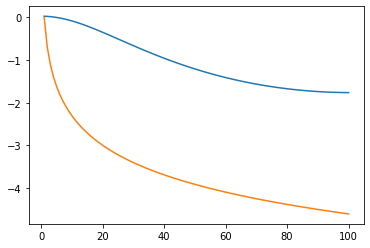

time: 5.81 s (started: 2021-05-11 18:27:54 +00:00)


In [ ]:
x_dim = 100
true_a = torch.tensor(0.42)
true_ode_func = NNModel.Linear_ODE_single_var(x_dim, true_a).to(device)

u, s, vh = torch.linalg.svd(true_ode_func.A, full_matrices=False)
print(s)

x = torch.arange(1,x_dim+1)
y = torch.log(s).cpu().detach().numpy()
z = torch.log(x).numpy()
plt.plot(x,y)
plt.plot(x,-z)

In [ ]:
x_dim=25
def tridiag(a, b, c, k1=-1, k2=0, k3=1):
  return np.diag(a, k1) + np.diag(b, k2) + np.diag(c, k3)

a = 0.3*np.ones(x_dim-1)
b = 0.6*np.ones(x_dim)
c = 0.1*np.ones(x_dim-1)
d = torch.from_numpy(tridiag(a,b,c))

torch.cholesky(d)
# u, s, vh = torch.linalg.svd(d, full_matrices=False)
# # print(s)

# x = torch.arange(1,x_dim+1)
# y = s.cpu().detach().numpy()
# z = torch.log(x).numpy()
# plt.plot(x,y)
# # plt.plot(x,-z)

In [ ]:
torch.backends.cudnn.benchmark = True

time: 1.03 ms (started: 2021-04-27 23:14:04 +00:00)


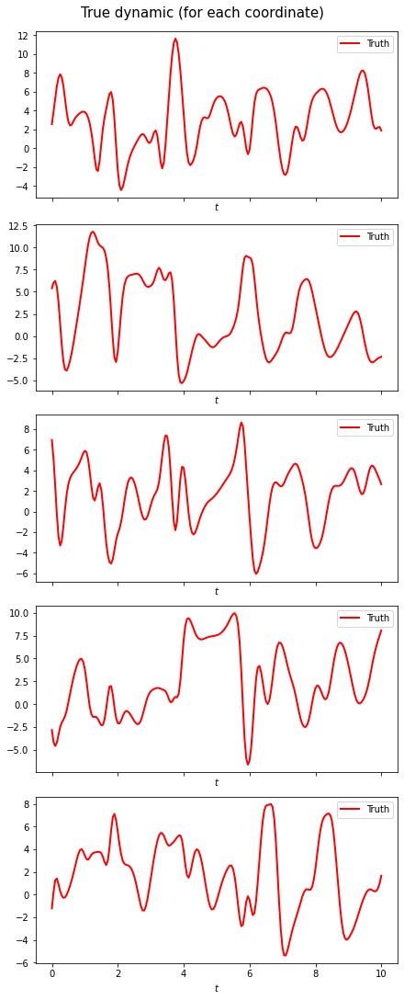

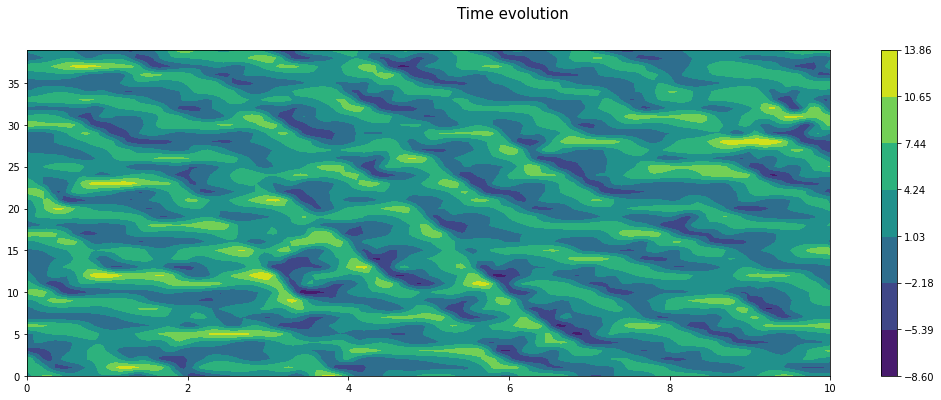

torch.Size([2, 40]) torch.Size([200, 2, 40]) torch.Size([200, 2, 40])
time: 13.4 s (started: 2021-05-13 16:30:57 +00:00)


In [ ]:
torch.manual_seed(42)
np.random.seed(42)

x_dim = 40
true_F = 8.
true_ode_func = NNModel.Lorenz96(F=true_F, x_dim=x_dim, device=device).to(device)

with torch.no_grad():
  u0_warmup = torch.distributions.MultivariateNormal(torch.zeros(x_dim), covariance_matrix=25 * torch.eye(x_dim)).sample().to(device) # <-
  out_warmup = odeint(true_ode_func, u0_warmup, torch.tensor([0., 240., 480.], device=device), method='rk4', options=dict(step_size=0.05))
  u0 = out_warmup[1:]  # (*bs, x_dim)

t0 = 0.
t_obs_step = 0.05
t_obs_end = 10.
t_obs = torch.arange(t0, t_obs_end+t_obs_step, t_obs_step)[1:].to(device)

model_Q_true =None #0.01*torch.eye(x_dim, device=device)

indices = [i for i in range(x_dim)]
# indices = [3 * i for i in range(14)] + [3 * i + 1 for i in range(13)]
# indices = [2 * i for i in range(20)]
y_dim = len(indices)
time_varying_obs = False
if time_varying_obs:
  true_obs_func = []
  for j in range(t_obs.shape[0]):
    indices = np.random.choice(x_dim, y_dim, False)
    H_true = torch.eye(x_dim)[indices]
    true_obs_func.append(NNModel.Linear(x_dim, y_dim, H=H_true).to(device))
else:    
  H_true = torch.eye(x_dim)[indices]
  true_obs_func = NNModel.Linear(x_dim, y_dim, H=H_true).to(device)

noise_R_true = 1 * torch.eye(y_dim, device=device)

with torch.no_grad():
  out, y_obs, out_intermediate, t_intermediate = DEModel.generate_data(true_ode_func, true_obs_func, t_obs, u0, model_Q_true, noise_R_true, 
                                                device=device, ode_method='rk4', ode_options=dict(step_size=0.05), adjoint=False, save_intermediate_step=True, t0=0., time_varying_obs=time_varying_obs)

utils.plot_dynamic(t_intermediate, out_intermediate[:,0], t_obs=None, y_obs=None, fig_num_limit=5, text="obs", contour_plot=True)
# y_obs = y_obs.repeat(16, 1, 1).transpose(0, 1)
# y_obs = y_obs.reshape(-1, 16, y_dim)
print(u0.shape, out.shape, y_obs.shape)

In [ ]:
init_m = torch.zeros(x_dim, device=device)
init_C_param = 50 * torch.eye(x_dim, device=device)
model_Q_param = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
test_coeff = torch.tensor([8., 0., 0., -1, 0., 0., 0., 0., 0., 0., 0., -1., 0., 0., 0., 0., 1., 0.], device=device)
# test_coeff += 0.001 * torch.randn_like(test_coeff)

enkf_kwargs = dict(ode_method='rk4', ode_options=dict(step_size=0.05), adjoint=True, adjoint_method='rk4', adjoint_options=dict(step_size=0.05),save_intermediate_step=True, smooth_lag=0, t0=t0, 
          var_inflation=None, localization_radius=5, compute_likelihood=True, likelihood_warmup=0, 
          linear_obs=True, time_varying_obs=time_varying_obs, save_first=True, simulation_type=0)

time: 20.3 ms (started: 2021-05-13 16:31:21 +00:00)


In [ ]:
with torch.no_grad():
  u0_warmup = torch.distributions.MultivariateNormal(init_m, covariance_matrix=init_C_param).sample((50,)).to(device) # <-
  t_warmup = torch.cat((torch.tensor([0.]), torch.arange(80.,1000.,20.))).to(device)
  out_warmup = odeint(true_ode_func, u0_warmup, t_warmup, method='rk4', options=dict(step_size=0.05))
  u0_test = out_warmup[1:].reshape(-1,x_dim)  # (*bs, x_dim)
  print(u0_test.shape)

torch.Size([2300, 40])
time: 17.1 s (started: 2021-05-04 16:52:14 +00:00)


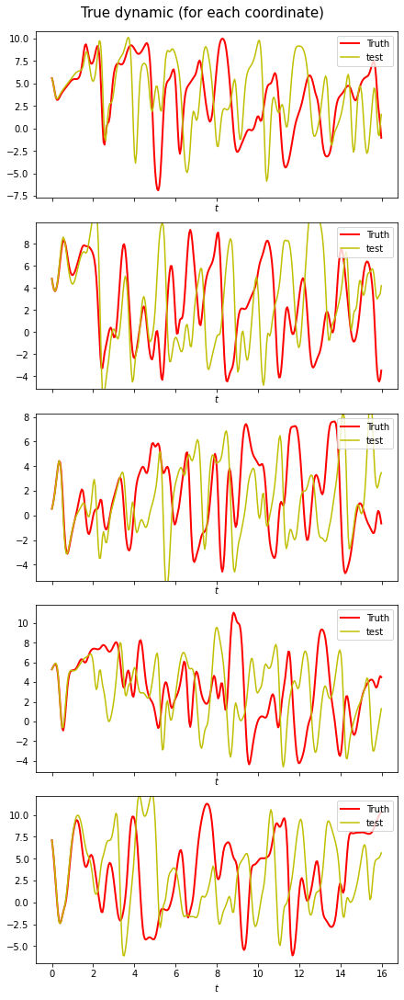

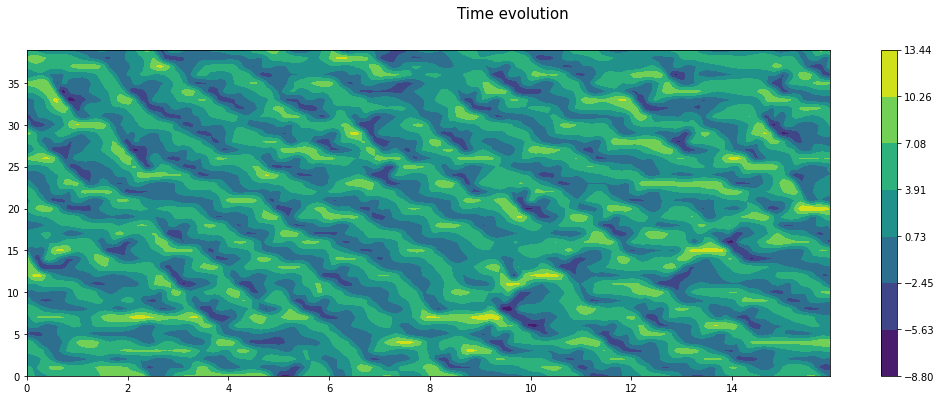

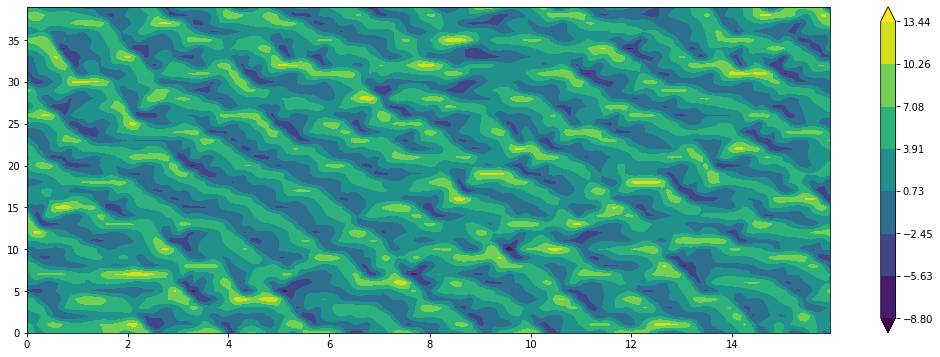

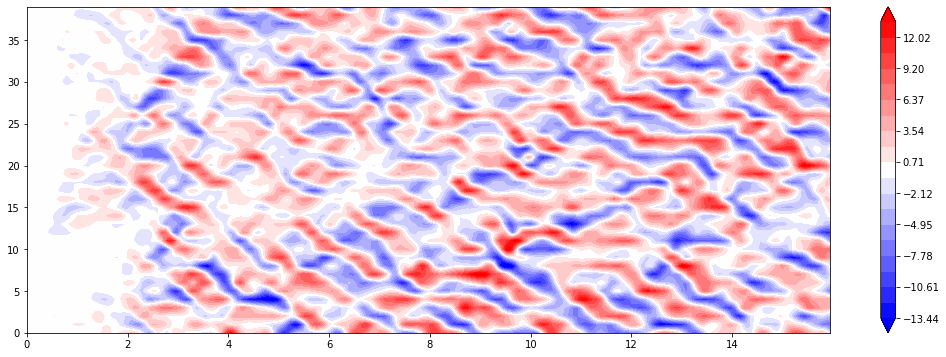

time: 5.35 s (started: 2021-04-22 23:42:04 +00:00)


In [ ]:
u0_warmup = torch.distributions.MultivariateNormal(torch.zeros(x_dim), covariance_matrix=25 * torch.eye(x_dim)).sample().to(device) # <-
out_warmup = odeint(true_ode_func, u0_warmup, torch.tensor([0., 40.], device=device), method='rk4', options=dict(step_size=0.05))
u0_test2 = out_warmup[1]
# learned_model_Q = utils.softplus(monitor_res_all_diff[0,-1,0:3])**2 * torch.eye(3)
# u0_test2 = torch.tensor([5., 6., 7.]).to(device)
t_obs_test = torch.arange(0.05, 16, 0.05, device=device)
out_test1, _, out_intermediate1, t_intermediate1 = DEModel.generate_data(learned_ode_func, None, t_obs_test, u0_test2, None, None, device, ode_method='rk4', ode_options=dict(step_size=0.05),adjoint=False, save_intermediate_step=True)
out_test_true1, _, out_intermediate_true1, _ = DEModel.generate_data(true_ode_func, None, t_obs_test, u0_test2, None, None, device, ode_method='rk4', ode_options=dict(step_size=0.05),adjoint=False, save_intermediate_step=True)
utils.plot_dynamic(t_intermediate1, out_intermediate_true1[:], t_obs=None, y_obs=out_intermediate1[:], fig_num_limit=5, text="test", contour_plot=True)

Forward, Elapsed: 1.1521906852722168s


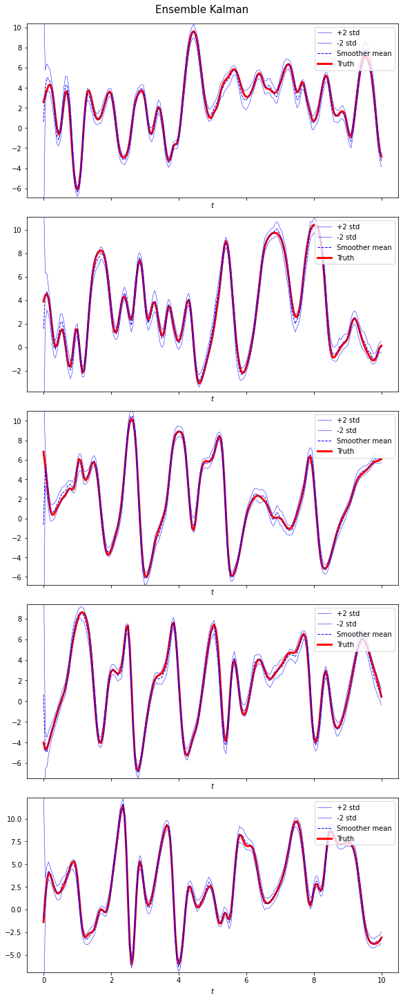

tensor([11885.8662, 11890.0635, 11888.4082, 11883.2959], device='cuda:0',
       grad_fn=<AddBackward0>)
Backward, Elapsed: 2.1078803539276123s
tensor([ -233.0677,  -174.5833,    28.8859,  -677.6101,  -560.2180,  -457.3112,
        -3903.1362, -1775.7776, -6188.3418, -4495.3042, -2881.8635,  2188.0439,
         -871.5876, -1642.5707, -1702.2977,  1247.7791,   557.1946,  -721.5726],
       device='cuda:0')


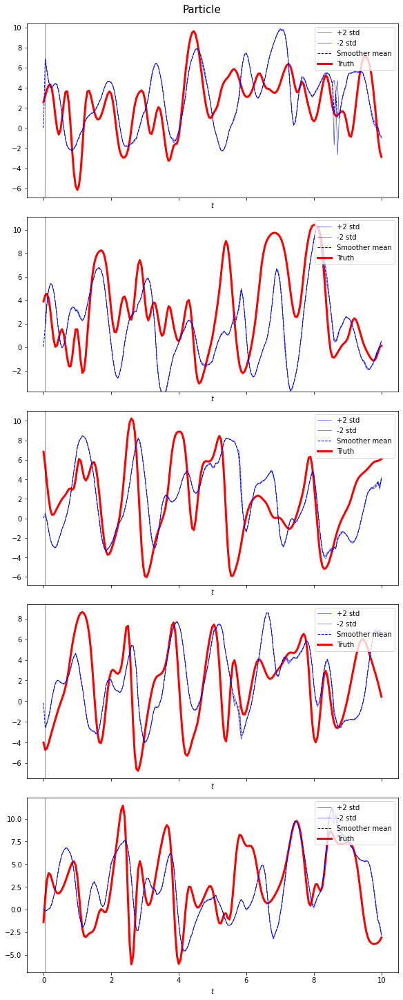

tensor(83824.4375, device='cuda:0', grad_fn=<AddBackward0>)
tensor([3.0035, 3.6735, 4.0222, 3.7627, 3.4898, 3.4429, 3.9050, 3.6623, 4.4891,
        5.1712, 3.9507, 4.5936, 4.6265, 4.2196, 3.7856, 4.6206, 4.7354, 3.7224,
        4.6716, 3.8392, 4.2560, 3.9591, 4.5972, 4.3469, 3.8720, 3.8307, 3.5856,
        4.0378, 3.3474, 4.2001, 4.8497, 4.0148, 5.3290, 4.8006, 4.5141, 4.6033,
        4.7405, 4.4969, 3.9084, 4.2401], device='cuda:0')
tensor(4.2041, device='cuda:0')
tensor([  -187.6453,   -911.5999,    870.4862,   2551.6287,   -613.7550,
         -1940.9248, -10713.5645,   -398.0453,  10659.8633,  -2400.9756,
        -11064.9229,    937.5201,   9410.5664,   3770.2832,  -5794.3066,
          6981.1084,   1115.4475,   1512.6857], device='cuda:0')


tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')

time: 15.4 s (started: 2021-05-13 16:31:42 +00:00)


In [ ]:
importlib.reload(DAModel)
importlib.reload(NNModel)
importlib.reload(utils)
# test_coeff = torch.zeros(18, device=device)
test_coeff = torch.tensor([8., 0., 0., -1, 0., 0., 0., 0., 0., 0., 0., -1., 0., 0., 0., 0., 1., 0.], device=device)
test_ode_func = NNModel.Lorenz96_dict_param(test_coeff, device, x_dim).to(device)
# test_ode_func = NNModel.L96_ODE_Net_2(40).to(device)
# test_ode_func = NNModel.ODE_Net(40,[40,64,64,40]).to(device)
learned_model_Q =utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
# learned_model_Q = monitor_res_all_diff[0,-1,0:3]

with Timer("Forward"):
  X, X_track, X_intermediate, neg_log_likelihood = DAModel.EnKF(test_ode_func, true_obs_func, t_obs, y_obs[:,1].unsqueeze(-2).repeat(1,4,1), N_ensem=50, init_m=init_m, init_C_param=init_C_param, model_Q_param=learned_model_Q, noise_R_param=noise_R_true, device=device, **enkf_kwargs)
utils.plot_filter(t_intermediate[:], out_intermediate[:,1], X_intermediate[:,0], plot_all=False, fig_num_limit=5)
print(neg_log_likelihood)
# print(torch.sqrt(utils.mse_loss_last_dim(X_track.mean(dim=-2)[1:], out[:,1])))
# print(torch.sqrt(utils.mse_loss(X_track.mean(dim=-2)[1:], out[:,1])))
with Timer("Backward"):
  neg_log_likelihood.sum().backward()
for param in test_ode_func.parameters():
  print(param.grad)
# print(test_ode_func.coeff.grad)
# test_ode_func.coeff.grad.zero_()

X_track, X_intermediate, w_track, w_intermediate, neg_log_likelihood = DAModel.BootstrapPF(test_ode_func, true_obs_func, t_obs, y_obs[:,1], N_ensem=10000, init_m=init_m, init_C_param=init_C_param, model_Q_param=learned_model_Q, noise_R_param=noise_R_true, device=device, proposal='optimal', **enkf_kwargs)
utils.plot_filter(t_intermediate[:], out_intermediate[:,1], (w_intermediate[:], X_intermediate[:]), name="Particle", plot_all=False, fig_num_limit=5)
print(neg_log_likelihood)
print(torch.sqrt(utils.particle_mse_loss_last_dim(X_track[1:], out[:,1], w_track[1:])))
print(torch.sqrt(utils.particle_mse_loss(X_track[1:], out[:,1], w_track[1:])))
neg_log_likelihood.sum().backward()
print(test_ode_func.coeff.grad)
test_ode_func.coeff.grad.zero_()

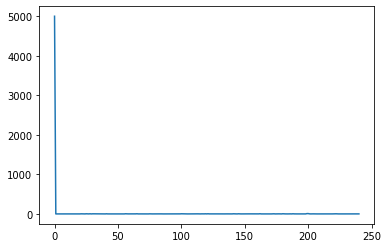

time: 159 ms (started: 2021-04-20 07:49:12 +00:00)


In [ ]:
a = 1/((w_track**2).sum(dim=-1))
plt.figure()
plt.plot(a.cpu().numpy())

In [ ]:
importlib.reload(utils)
importlib.reload(DAModel)
importlib.reload(sys.modules['core_training'])
from core_training import train_loop_diff, train_loop_em, train_loop_particle

def monitor(ode_func, model_Q_param, neg_log_likelihood, test_neg_log_likelihood, test_mse, nll_suro_em, algorithm, device):
  res = torch.zeros(0, device=device)
  res = torch.cat((res, utils.mse_loss(ode_func.coeff, test_coeff).detach().clone().view(-1)))
  res = torch.cat((res, ode_func.coeff.detach().clone().view(-1)))
  res = torch.cat((res, model_Q_param.detach().clone().view(-1)))
  res = torch.cat((res, neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_mse.mean().detach().clone().view(-1)))
  res = torch.cat((res, fs.mean().detach().clone().view(-1)))
  # if algorithm == "em":
  #   res = torch.cat((res, nll_suro_em.mean().detach().clone().view(-1)))
  # res = torch.cat((res, ode_func.coeff.grad.detach().clone().view(-1)))

  # for param in ode_func.parameters():
  #   print(param)
  return res.unsqueeze(dim=0)

enkf_kwargs['save_intermediate_step']=False
coeff_list = torch.zeros(18).unsqueeze(0).repeat(4,1)
Q_list = utils.softplus_inv(2*torch.ones(x_dim, device=device)).unsqueeze(0).repeat(4,1)
coeff_list_clone = coeff_list.detach().clone()
Q_list_clone = Q_list.detach().clone()
coeff_list_clone2 = coeff_list.detach().clone()
Q_list_clone2 = Q_list.detach().clone()
N_ensem = 50

enkf_kwargs['likelihood_warmup']=30
monitor_res_all_diff = torch.zeros(0, device=device)
for iter in range(coeff_list.shape[0]):#iter in range(1): 
  learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
  learned_model_Q = nn.Parameter(Q_list[iter]).to(device)
  # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
  optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
                             {'params':learned_model_Q, 'lr':1e-1}])
  # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.5)
  monitor_res = train_loop_diff(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=100, 
                                scheduler=scheduler, batch_length=30, bs=8, print_every_n_epochs=20, test_every_n_epochs=1, tbptt=30,true_system="L96", method='enkf', train_size=1, clip_norm=None, monitor=monitor, **enkf_kwargs)
  monitor_res_all_diff = torch.cat((monitor_res_all_diff, monitor_res.unsqueeze(0)))

# enkf_kwargs['smooth_lag']=0
# enkf_kwargs['likelihood_warmup']=40
# monitor_res_all_em = torch.zeros(0, device=device)
# for iter in range(coeff_list.shape[0]):
#   learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list_clone[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
#                              {'params':learned_model_Q, 'lr':5e-2}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=400, gamma=0.5)
#   monitor_res = train_loop_em(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=75, 
#                               scheduler=None, batch_length=1200, bs=100, print_every_n_epochs=20, test_every_n_epochs=1, tbptt=1,true_system="L96", train_size=1, m_step_type="mean", m_steps=5, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_em = torch.cat((monitor_res_all_em, monitor_res.unsqueeze(0)))

# enkf_kwargs['likelihood_warmup']=30
# monitor_res_all_particle = torch.zeros(0, device=device)
# for iter in range(coeff_list.shape[0]):#iter in range(1): 
#   learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list_clone2[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
#                              {'params':learned_model_Q, 'lr':1e-1}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=400, gamma=0.5)
#   monitor_res = train_loop_particle(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=50, 
#                                 scheduler=None, batch_length=30, bs=8, print_every_n_epochs=20, test_every_n_epochs=5, tbptt=6,true_system="L96", train_size=1, clip_norm=None, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_particle = torch.cat((monitor_res_all_particle, monitor_res.unsqueeze(0)))


In [ ]:
utils.softplus_inv(torch.tensor(2))

tensor(1.8546)

time: 30.6 ms (started: 2021-04-27 23:23:48 +00:00)


Filter, Elapsed: 56.54979872703552s
Epoch 0: nll = 257661.25, test_nll = 187685.25


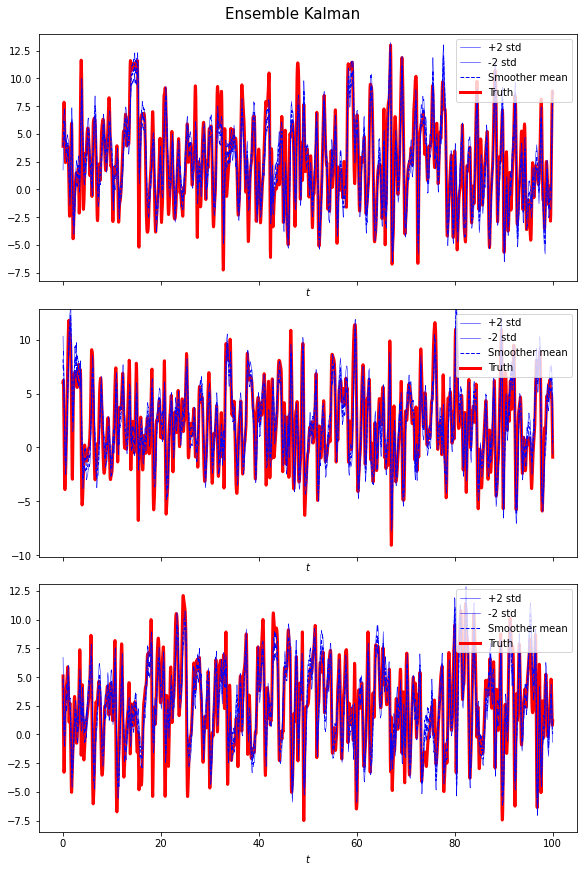

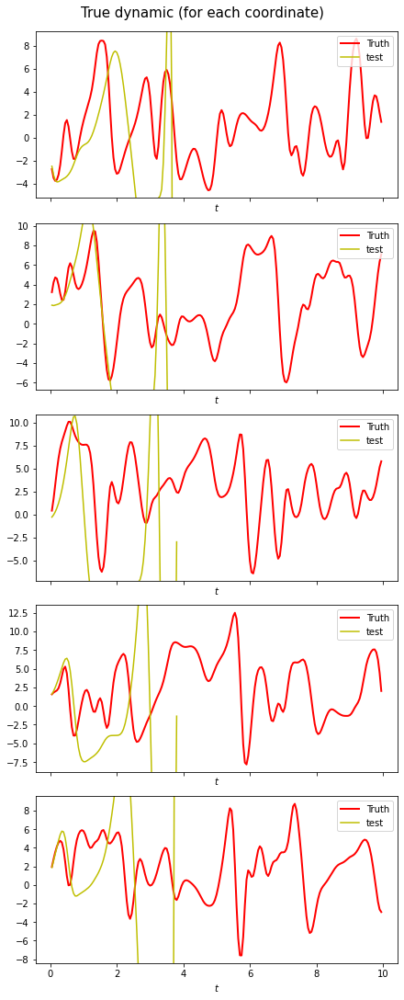

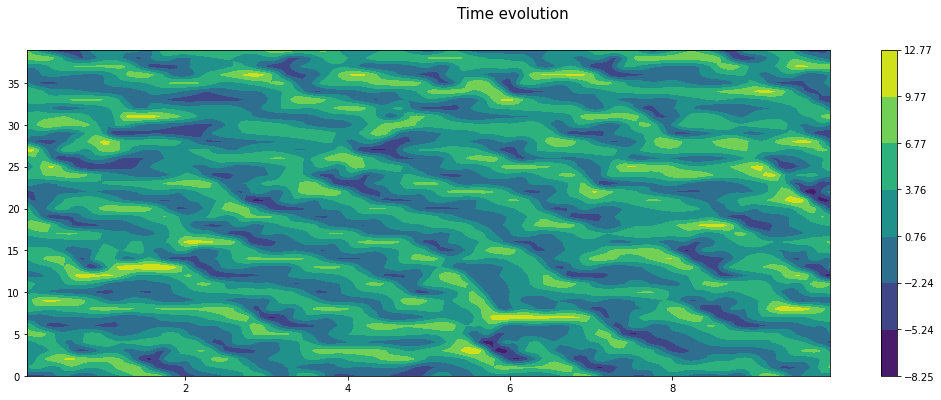

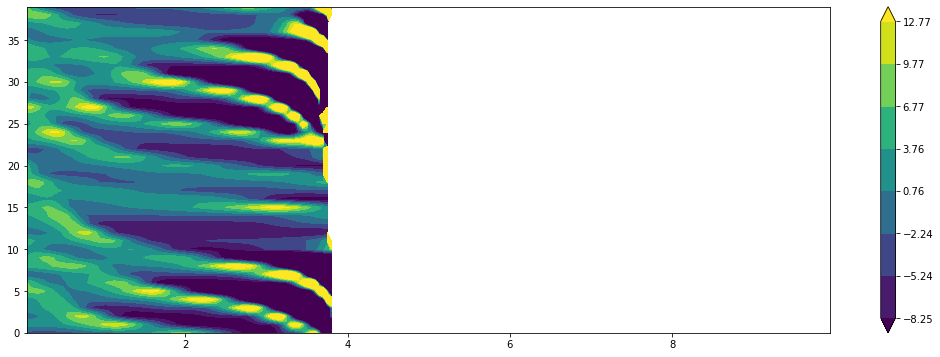

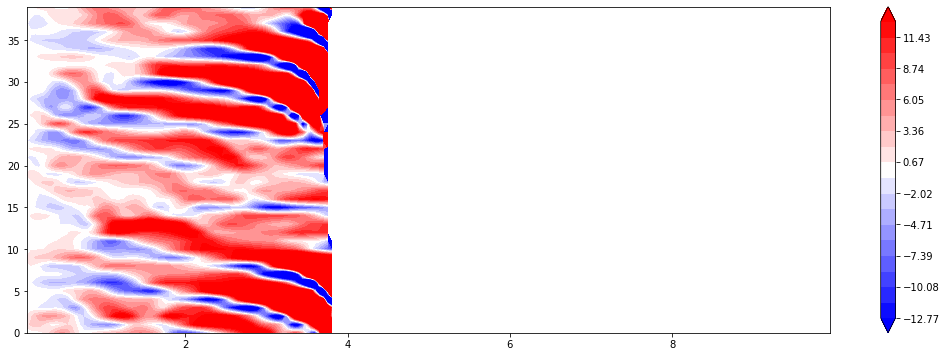

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          2.5766e+05,  1.8769e+05,  1.1954e+00,  5.4877e-01]], device='cuda:0')
Filter, Elapsed: 57.06214690208435s
Epoch 1: nll = 173003.96875, test_nll = 141363.546875
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982

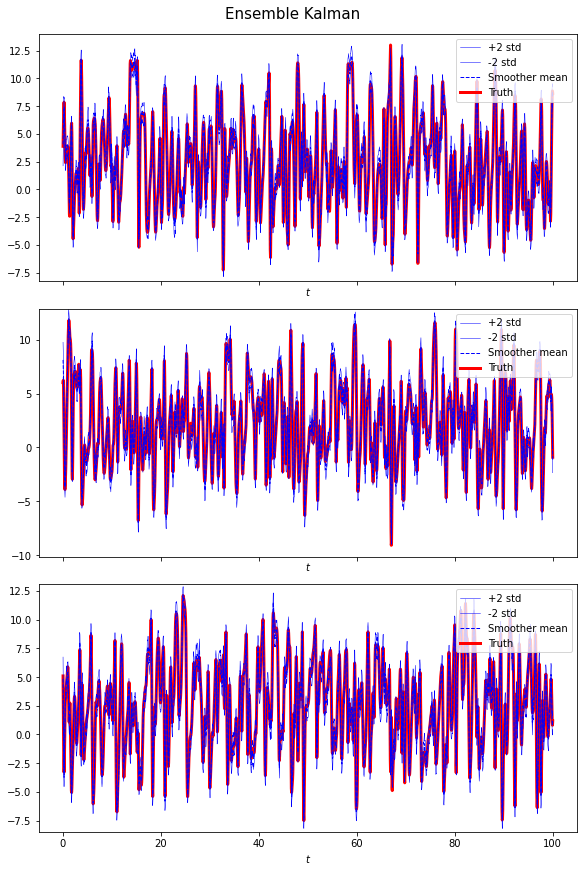

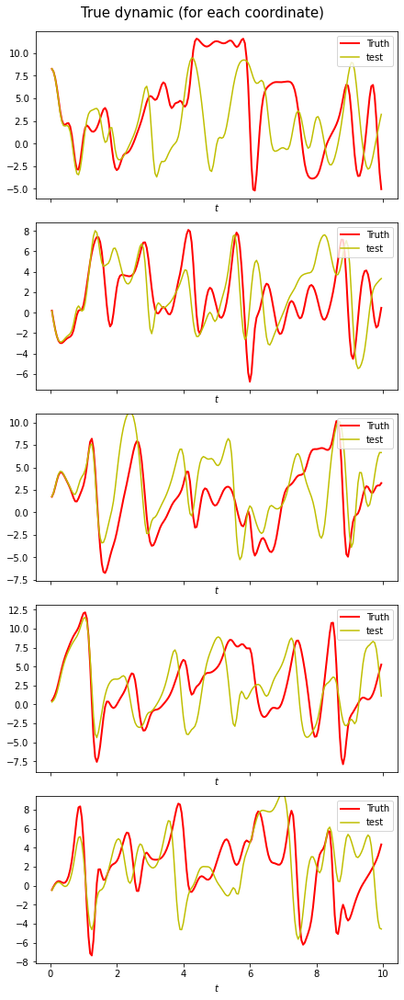

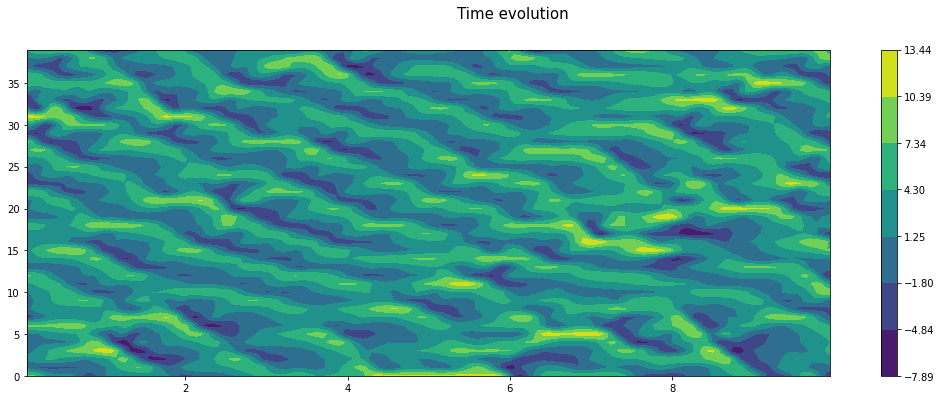

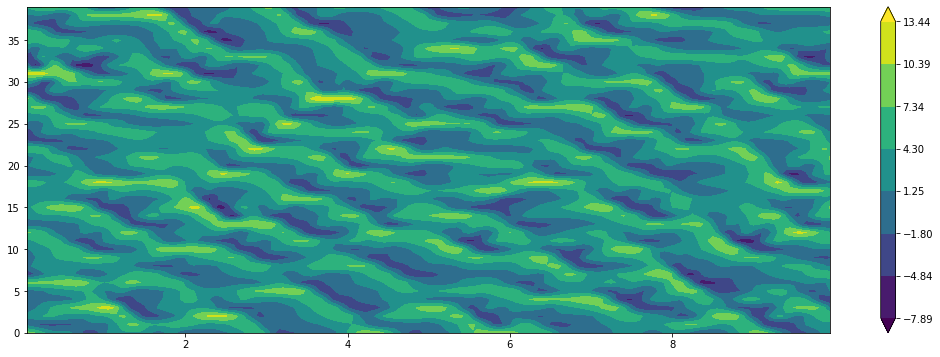

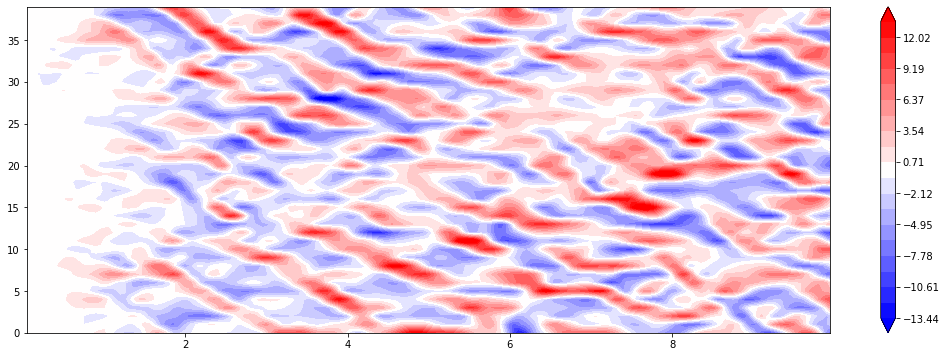

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.2063e+05,  1.2033e+05,  3.8682e-01,  6.9921e-02]], device='cuda:0')
Filter, Elapsed: 59.719602823257446s
Epoch 6: nll = 120361.7109375, test_nll = 120174.21875
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.29

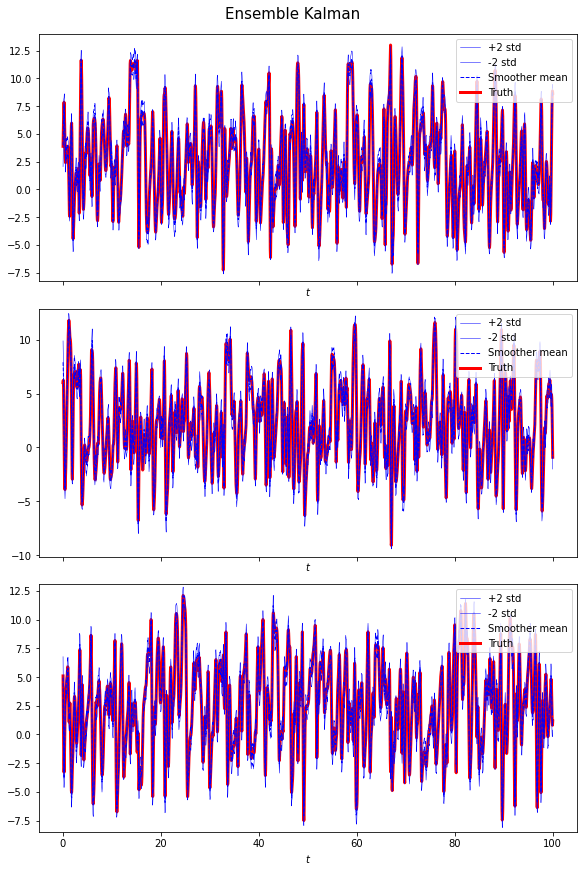

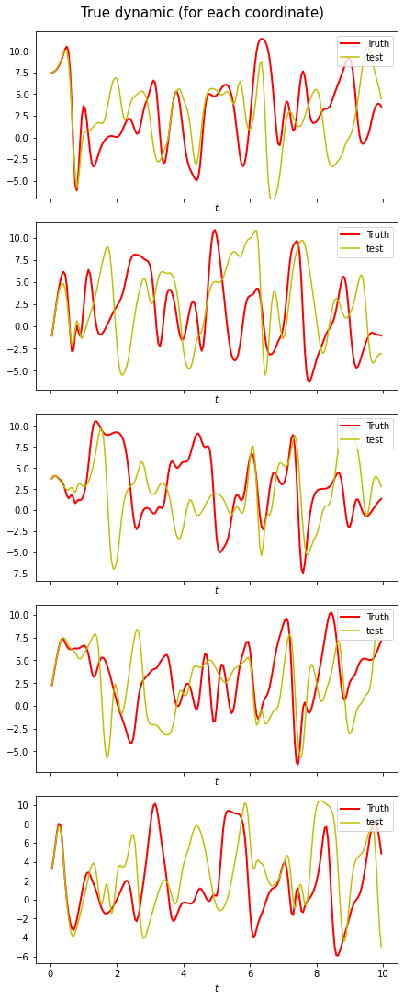

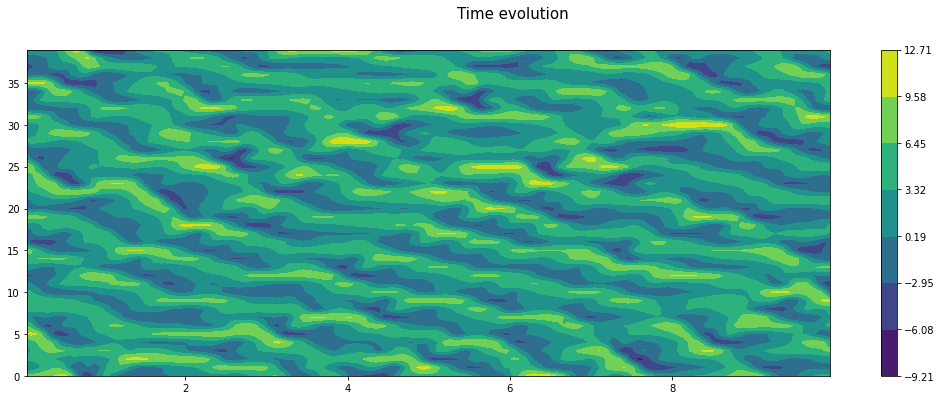

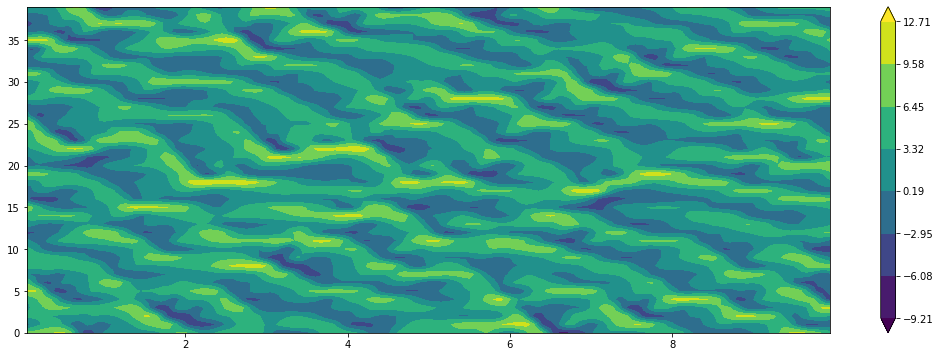

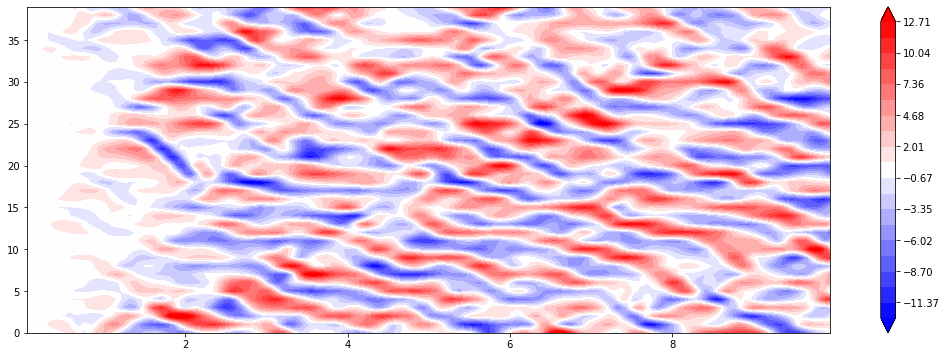

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.2004e+05,  1.1993e+05,  3.7726e-01,  5.4498e-02]], device='cuda:0')
Filter, Elapsed: 59.372007608413696s
Epoch 11: nll = 120004.9140625, test_nll = 119929.8515625
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1

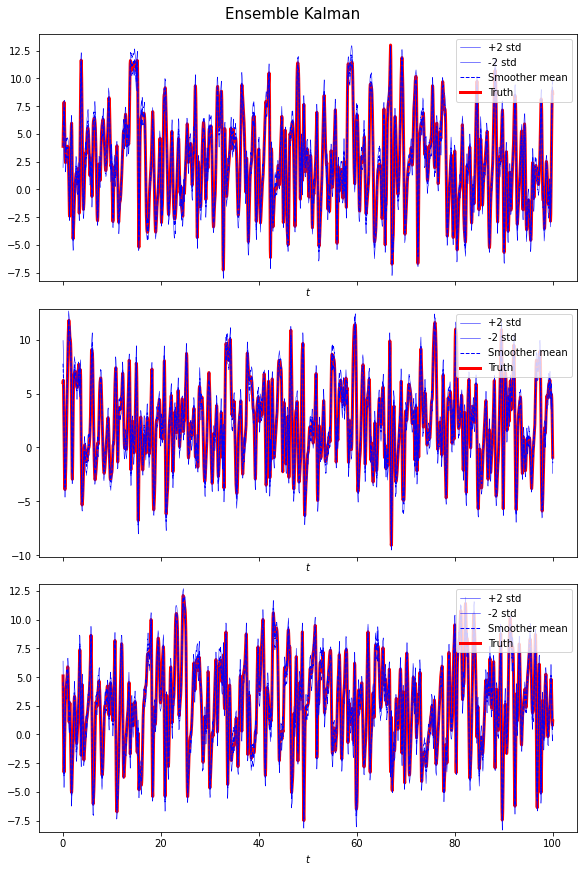

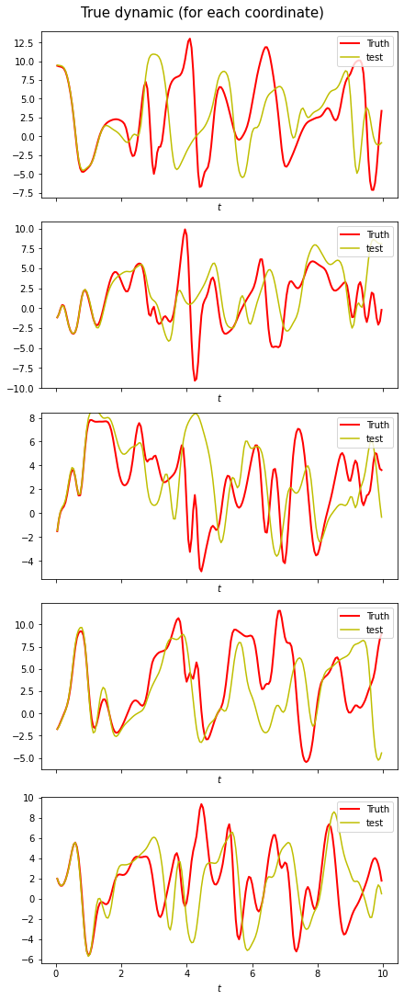

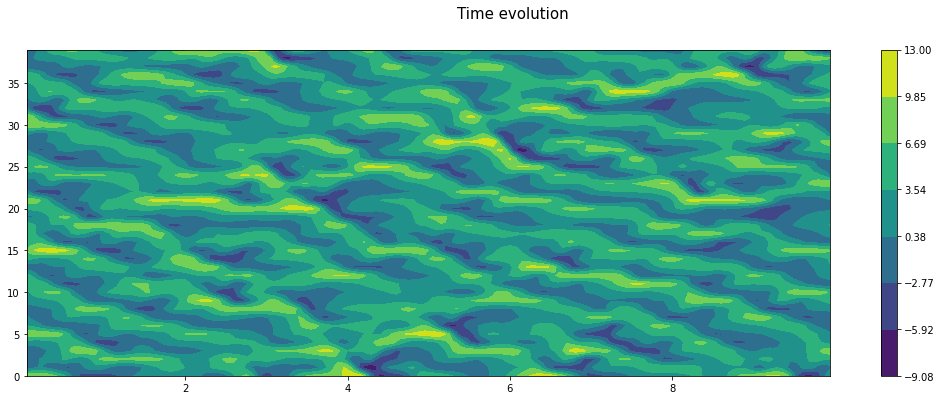

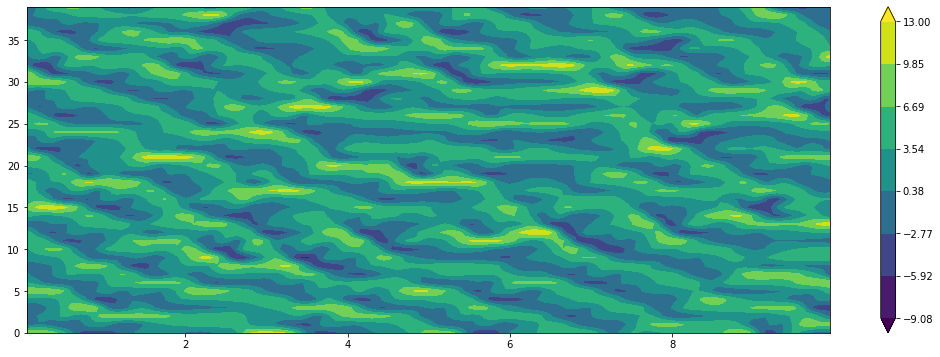

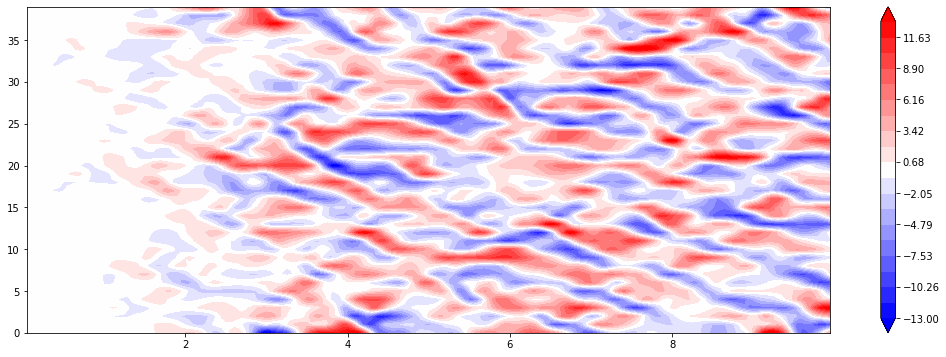

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1993e+05,  1.1990e+05,  3.7615e-01,  5.3219e-02]], device='cuda:0')
Filter, Elapsed: 60.79437875747681s
Epoch 16: nll = 119937.28125, test_nll = 119877.9375
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e

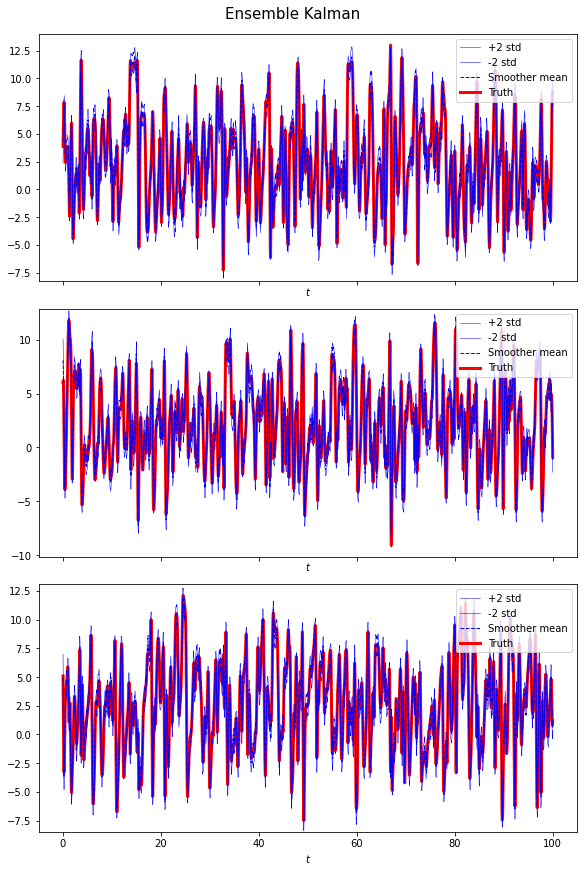

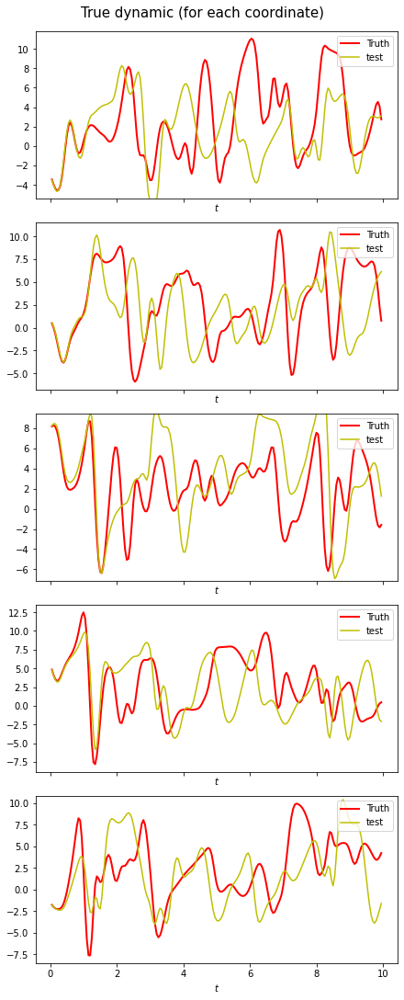

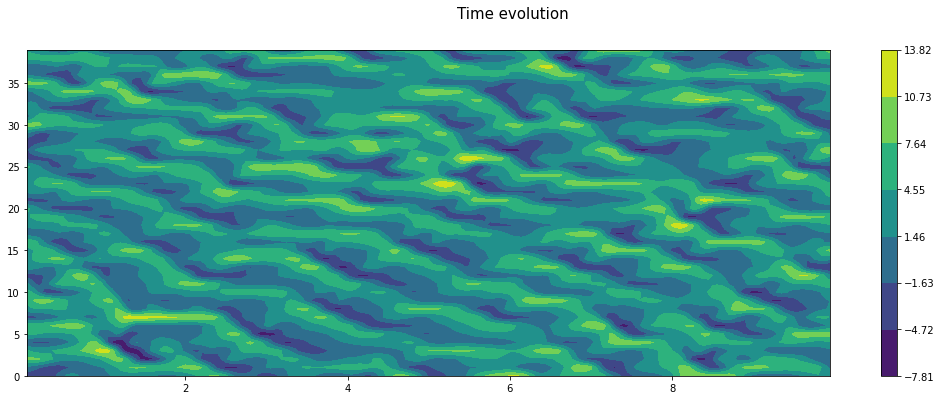

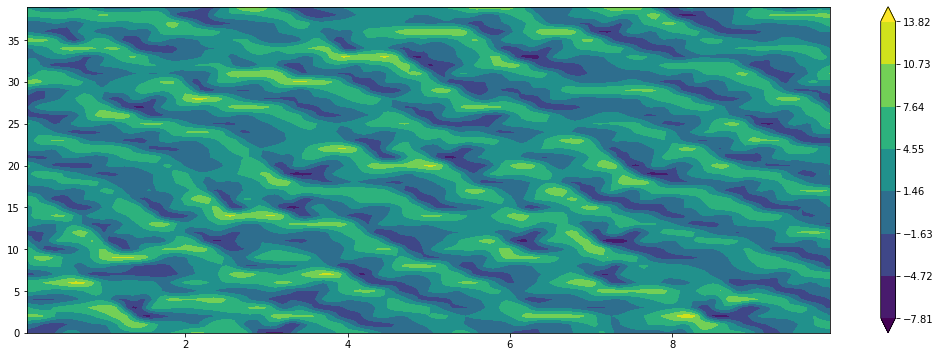

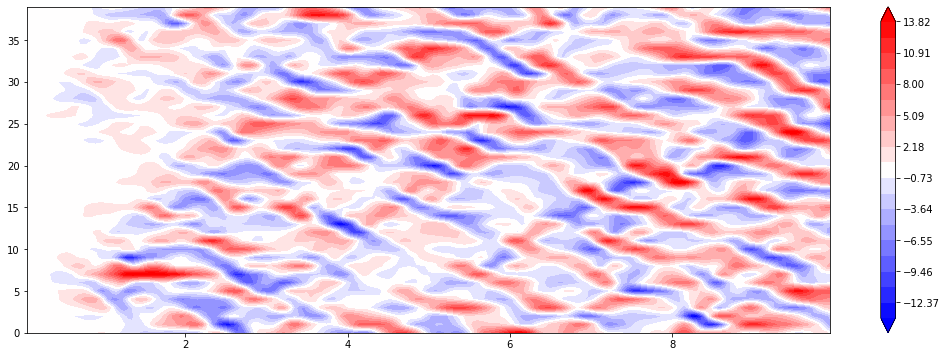

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1991e+05,  1.1986e+05,  3.7536e-01,  5.0948e-02]], device='cuda:0')
Filter, Elapsed: 60.224788188934326s
Epoch 21: nll = 119910.28125, test_nll = 119855.0390625
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2

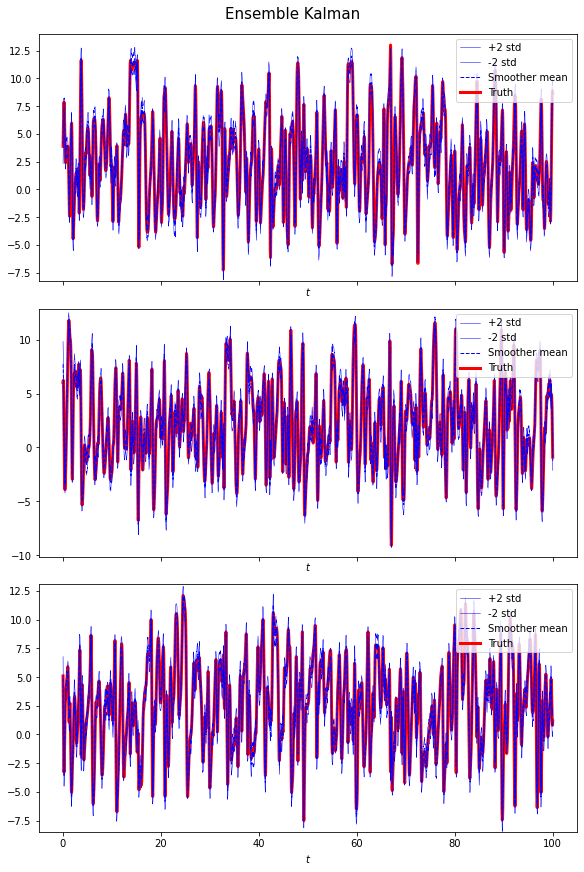

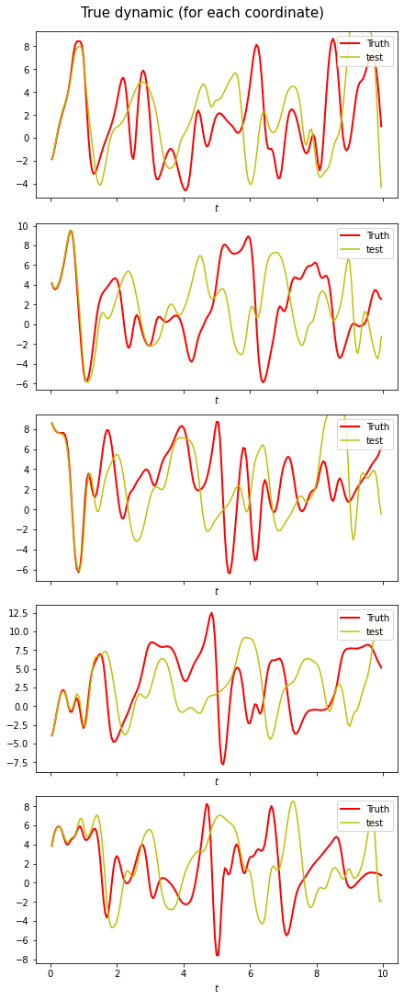

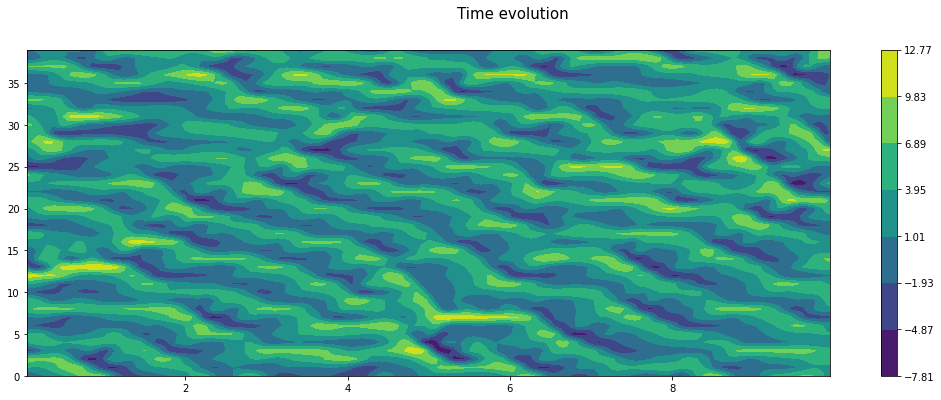

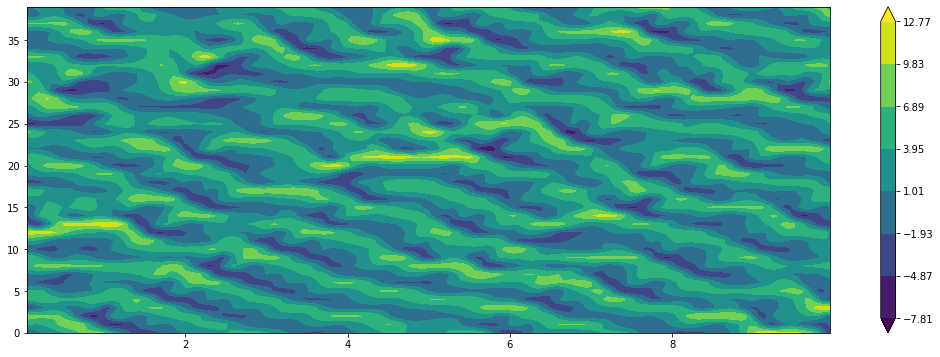

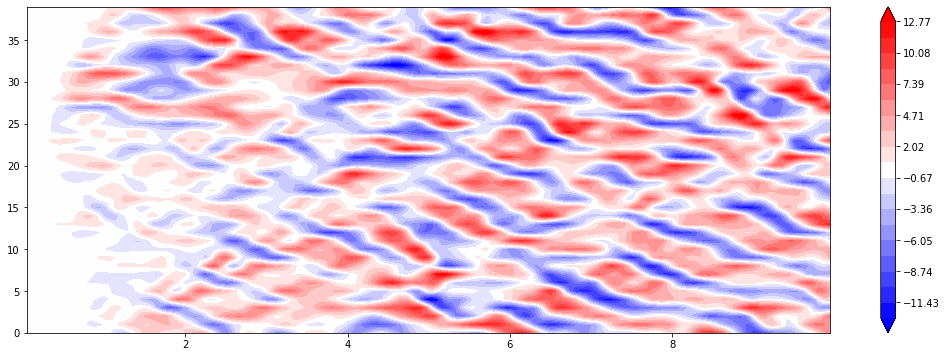

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1989e+05,  1.1984e+05,  3.7457e-01,  5.0467e-02]], device='cuda:0')
Filter, Elapsed: 59.49638319015503s
Epoch 26: nll = 119870.3203125, test_nll = 119841.28125
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.29

KeyboardInterrupt: ignored

time: 42min 39s (started: 2021-05-04 16:57:46 +00:00)


In [ ]:
importlib.reload(utils)
importlib.reload(DAModel)
importlib.reload(NNModel)
importlib.reload(sys.modules['core_training'])
from core_training import train_loop_diff, train_loop_em, train_loop_particle

def monitor(ode_func, model_Q_param, neg_log_likelihood, test_neg_log_likelihood, test_mse, fs, nll_suro_em, algorithm, device):
  res = torch.zeros(0, device=device)
  # res = torch.cat((res, ode_func.coeff.detach().clone().view(-1)))
  res = torch.cat((res, model_Q_param.detach().clone().view(-1)))
  res = torch.cat((res, neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_mse.mean().detach().clone().view(-1)))
  res = torch.cat((res, fs.mean().detach().clone().view(-1)))
  # if algorithm == "em":
  #   res = torch.cat((res, nll_suro_em.mean().detach().clone().view(-1)))
  # res = torch.cat((res, ode_func.coeff.grad.detach().clone().view(-1)))

  # for param in ode_func.parameters():
  #   print(param.grad)
  return res.unsqueeze(dim=0)


coeff_list = torch.zeros(18).unsqueeze(0).repeat(4,1)
Q_list = utils.softplus_inv(2*torch.ones(x_dim, device=device)).unsqueeze(0).repeat(4,1)
coeff_list_clone = coeff_list.detach().clone()
Q_list_clone = Q_list.detach().clone()
coeff_list_clone2 = coeff_list.detach().clone()
Q_list_clone2 = Q_list.detach().clone()
N_ensem = 50

enkf_kwargs['likelihood_warmup']=20

# enkf_kwargs['var_inflation']=1.03
monitor_res_all_diff = torch.zeros(0, device=device)
for iter in range(1):#iter in range(1): 
  # learned_ode_func = NNModel.Lorenz96_dict_param(test_coeff, device, x_dim).to(device)
  learned_ode_func = NNModel.L96_ODE_Net(x_dim).to(device)
  learned_model_Q = nn.Parameter(-0.7*Q_list[iter]).to(device)
  # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
  # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-2},
  #                            {'params':learned_model_Q, 'lr':1e-1}])
  optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-2}])
  # optimizer = torch.optim.Adam([{'params':learned_model_Q, 'lr':1e-1}])
  # scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=25, gamma=0.5)
  scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer,  gamma=0.85)
  monitor_res = train_loop_diff(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=51, 
                                scheduler=scheduler, batch_length=30, bs=4, print_every_n_epochs=5, test_every_n_epochs=1, tbptt=20, lr_decay=None, true_system="L96", true_ode_func=true_ode_func, u0_test=u0_test, draw_stats=False, method='enkf', train_size=1, clip_norm=None, monitor=monitor, **enkf_kwargs)
  monitor_res_all_diff = torch.cat((monitor_res_all_diff, monitor_res.unsqueeze(0)))

# enkf_kwargs['smooth_lag']=0
# enkf_kwargs['likelihood_warmup']=40
# monitor_res_all_em = torch.zeros(0, device=device)
# for iter in range(1):
#   learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list_clone[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
#                              {'params':learned_model_Q, 'lr':1e-1}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=25, gamma=0.5)
#   monitor_res = train_loop_em(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=75, 
#                               scheduler=scheduler, batch_length=1200, bs=100, print_every_n_epochs=5, test_every_n_epochs=5, tbptt=1,true_system="L96", train_size=1, m_step_type="mean", m_steps=5, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_em = torch.cat((monitor_res_all_em, monitor_res.unsqueeze(0)))

# enkf_kwargs['likelihood_warmup']=30
# monitor_res_all_particle = torch.zeros(0, device=device)
# for iter in range(1):#iter in range(1): 
#   learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list_clone2[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
#                              {'params':learned_model_Q, 'lr':1e-1}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=400, gamma=0.5)
#   monitor_res = train_loop_particle(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=50, 
#                                 scheduler=None, batch_length=30, bs=8, print_every_n_epochs=20, test_every_n_epochs=5, tbptt=6,true_system="L96", train_size=1, clip_norm=None, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_particle = torch.cat((monitor_res_all_particle, monitor_res.unsqueeze(0)))


In [ ]:
torch.save({'ode_state_diff': learned_ode_func.state_dict(), 'Q_diff': learned_model_Q,
          'monitor_res_all_diff': monitor_res_all_diff},
           f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/0503/L96_Q0_R1_OB005F_IT005_K2000_diff")

time: 11.7 ms (started: 2021-05-04 05:43:36 +00:00)


In [ ]:
print(learned_ode_func.state_dict())

OrderedDict([('layer1.weight', tensor([[[-0.5112,  1.0376,  0.0019,  0.4958,  0.0461]],

        [[-0.4902, -1.0436,  0.0284,  0.3844, -0.0419]],

        [[-0.1545, -0.1267,  0.3234,  0.3904,  0.3161]],

        [[ 0.4636,  0.9358,  0.0813, -0.4033,  0.0823]],

        [[ 0.5902,  0.3220, -0.2001,  0.0552,  0.6570]],

        [[ 0.3770, -1.0246, -0.1656, -0.5223, -0.0872]]], device='cuda:0')), ('layer1.bias', tensor([ 0.3630, -0.6415, -0.7001, -0.0207,  1.4512,  0.9185], device='cuda:0')), ('layer2.weight', tensor([[[ 4.4844e-01],
         [-5.4213e-01],
         [-3.0352e-01],
         [-6.3343e-01],
         [ 3.5691e-04],
         [ 4.1402e-01],
         [ 4.0381e-01],
         [ 9.7383e-03],
         [-2.2099e-01],
         [ 1.6800e-01],
         [ 1.0167e+00],
         [ 7.5717e-01]]], device='cuda:0')), ('layer2.bias', tensor([0.9863], device='cuda:0'))])
time: 14.6 ms (started: 2021-05-04 17:40:35 +00:00)


Filter, Elapsed: 25.008885622024536s
Epoch 0: nll = 345402.90625


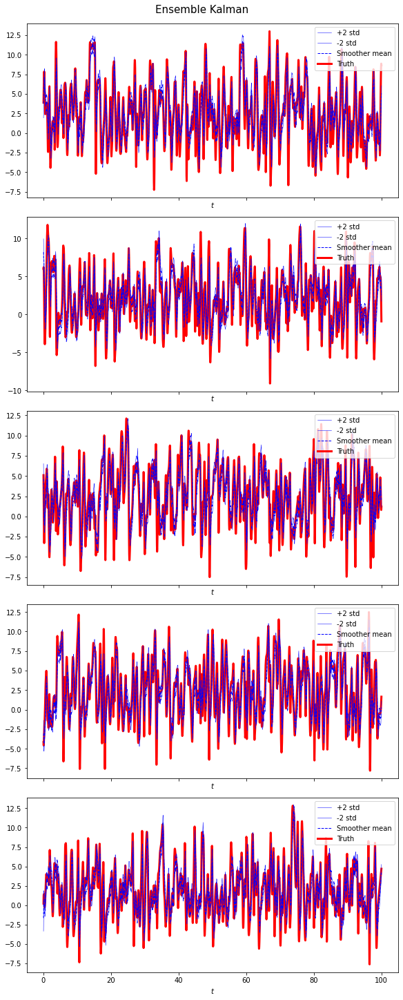

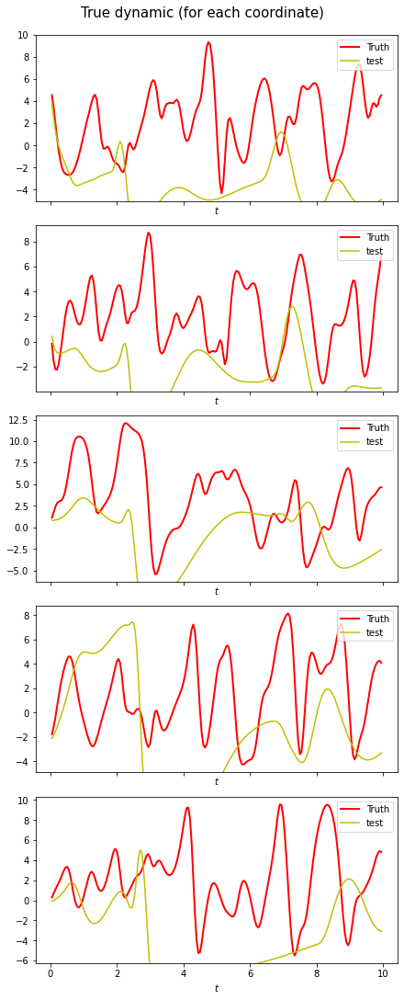

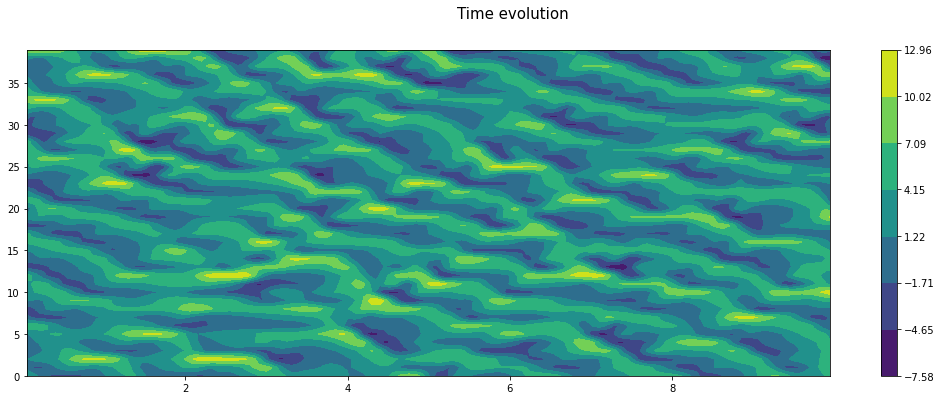

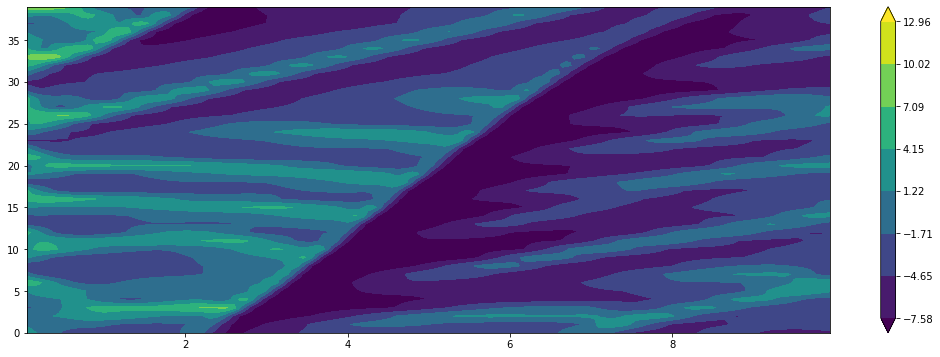

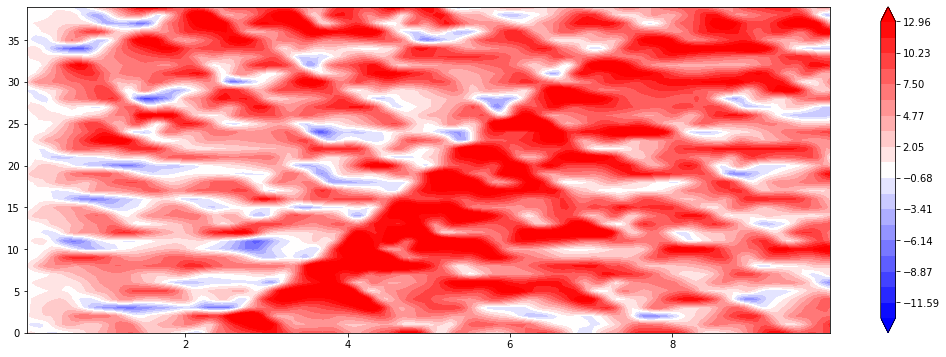

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          3.4540e+05,  1.7120e+05,  1.0674e+00,  4.5856e-01]], device='cuda:0')
Filter, Elapsed: 24.998549938201904s
Epoch 1: nll = 177194.859375
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.29

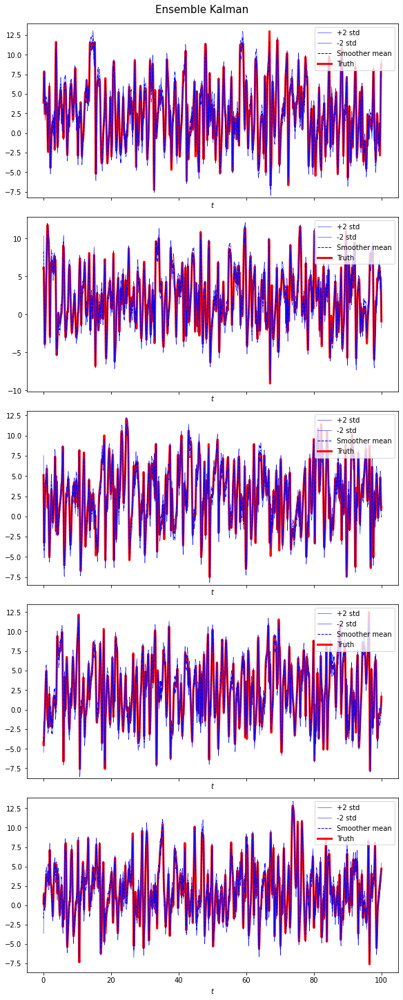

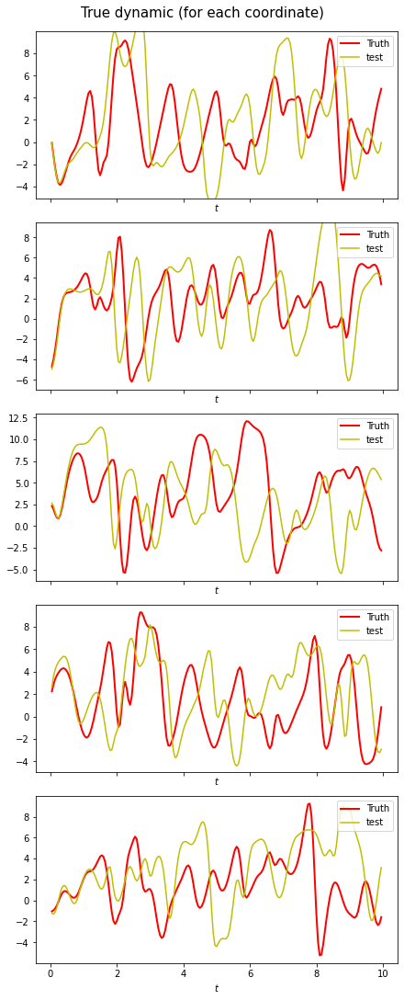

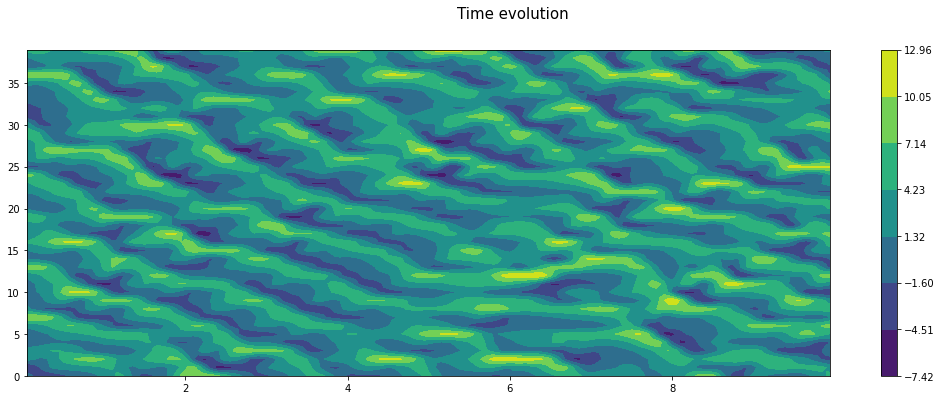

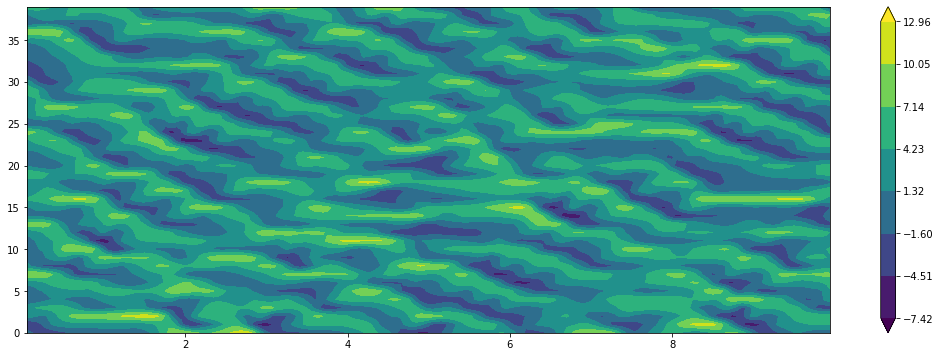

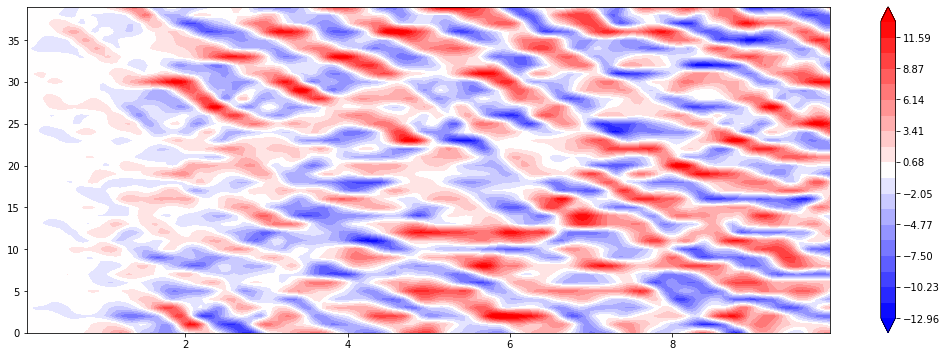

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.2762e+05,  1.2406e+05,  4.7533e-01,  1.8178e-01]], device='cuda:0')
Filter, Elapsed: 25.401147603988647s
Epoch 6: nll = 124400.53125
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.298

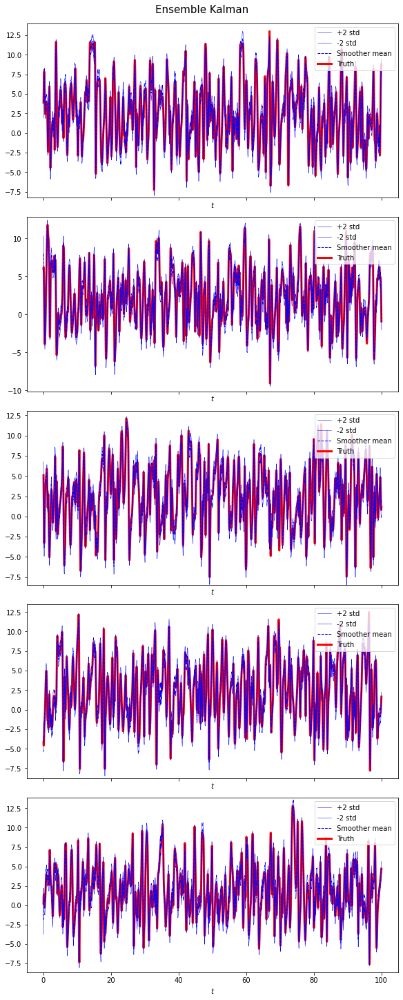

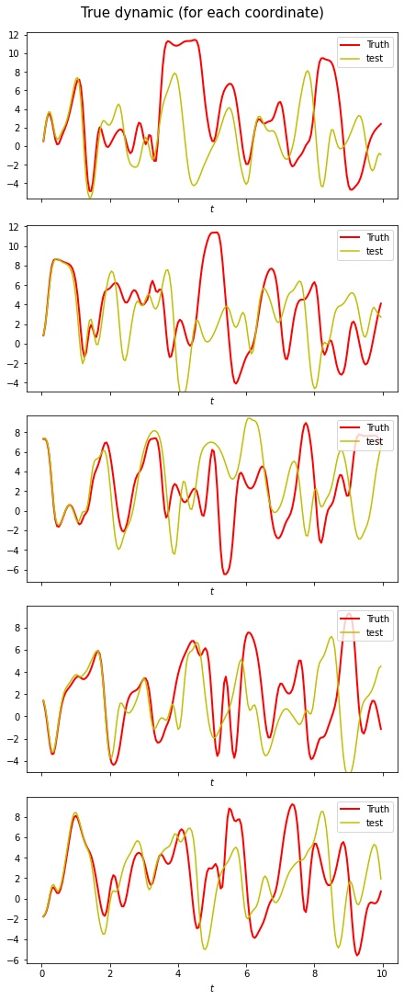

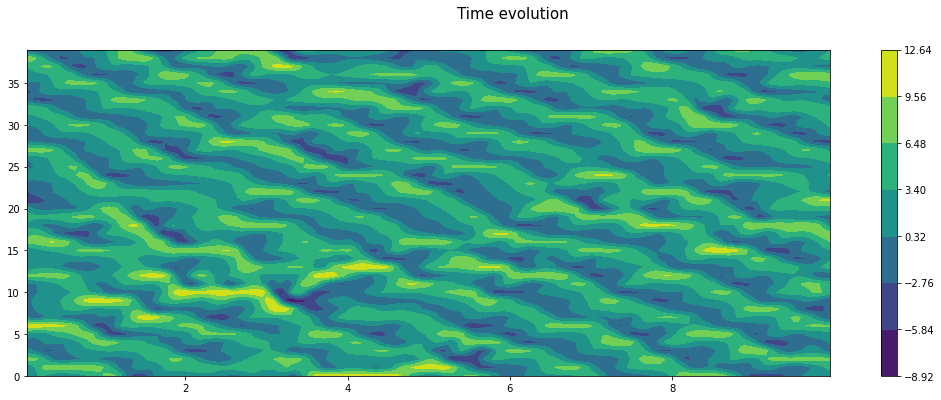

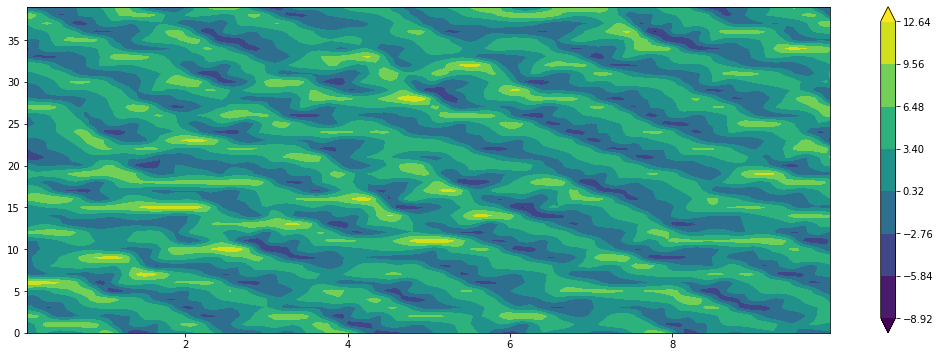

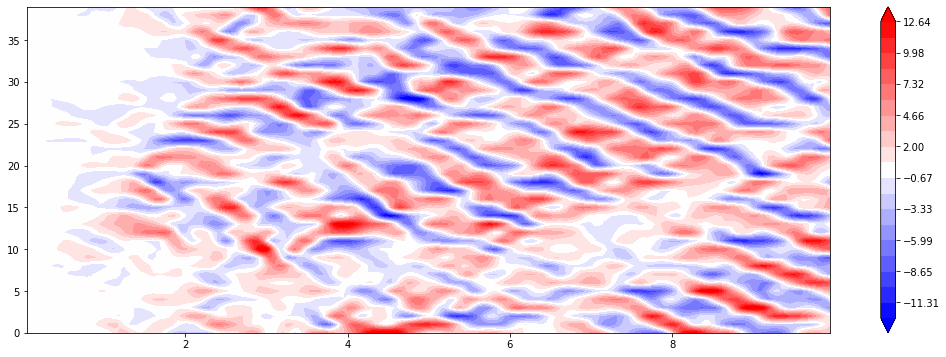

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.2075e+05,  1.2044e+05,  3.9287e-01,  8.2551e-02]], device='cuda:0')
Filter, Elapsed: 26.527262210845947s
Epoch 11: nll = 120575.5078125
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.

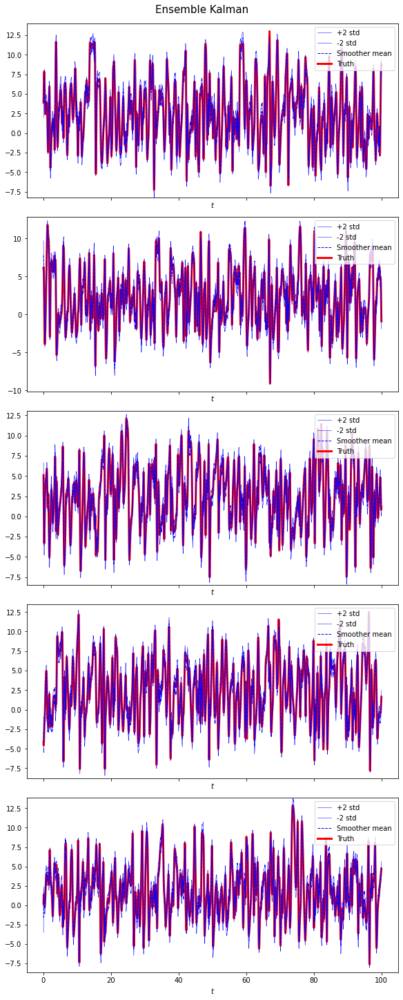

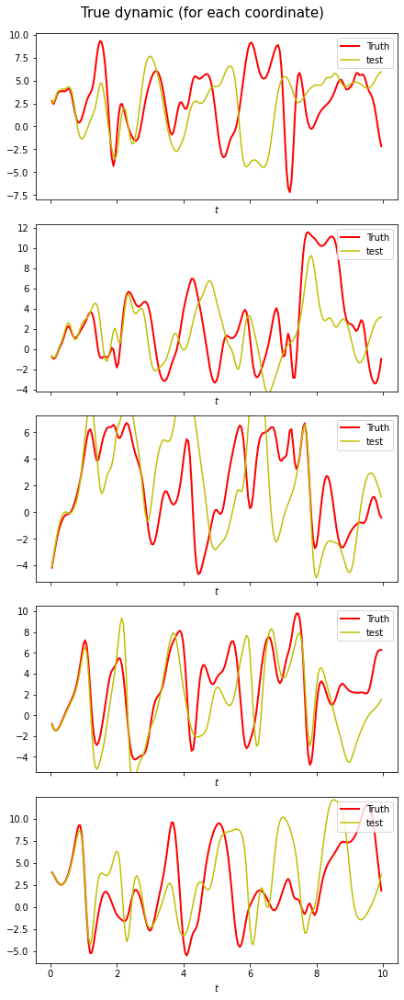

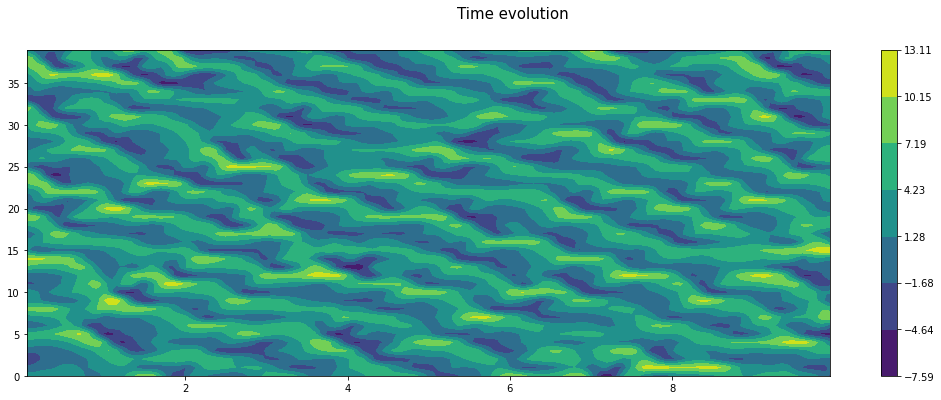

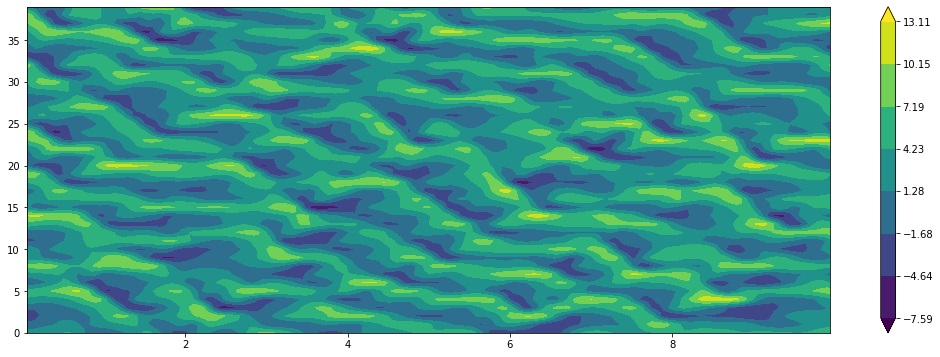

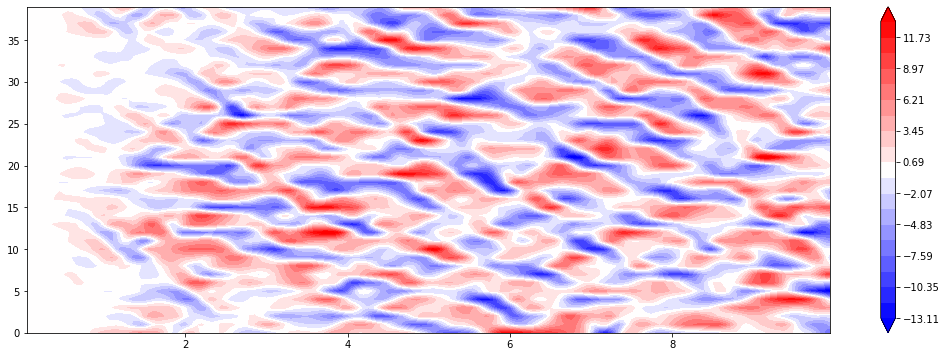

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.2018e+05,  1.2010e+05,  3.8223e-01,  6.2507e-02]], device='cuda:0')
Filter, Elapsed: 26.01287603378296s
Epoch 16: nll = 120152.859375
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.29

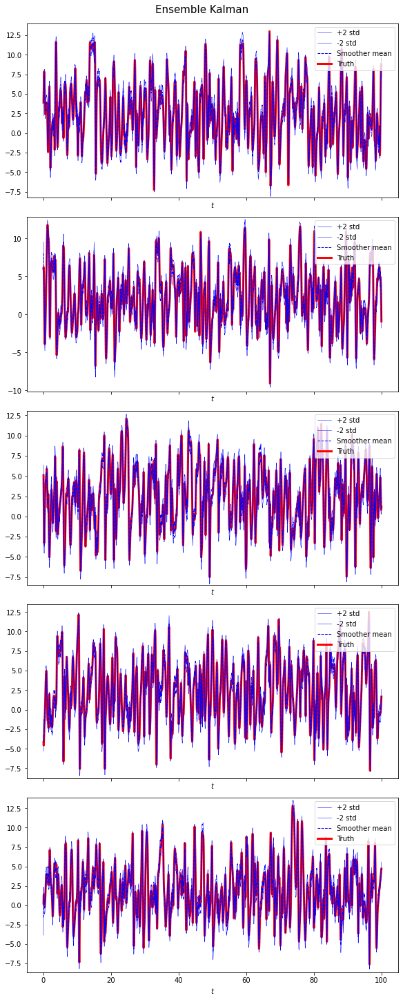

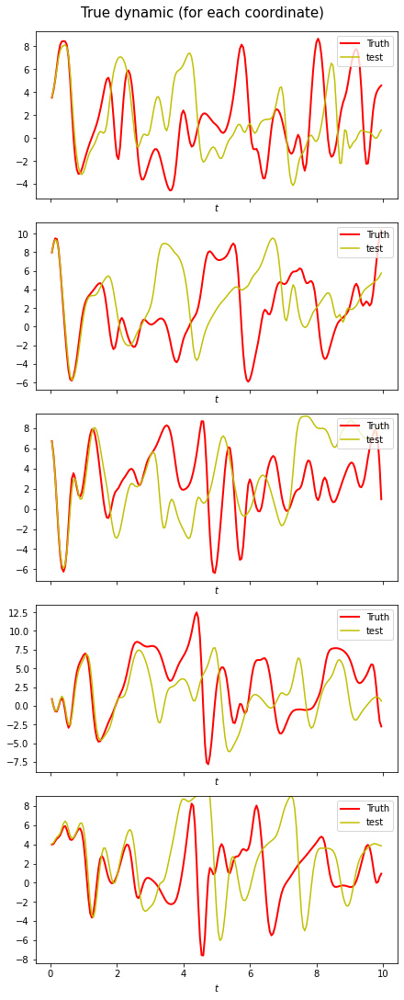

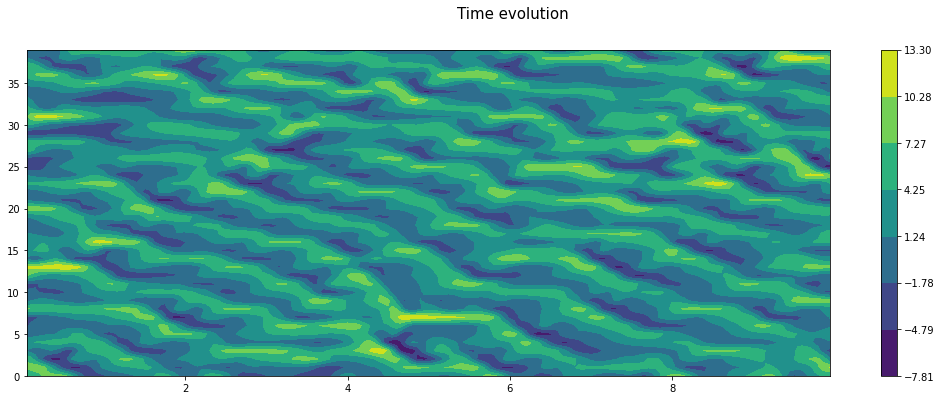

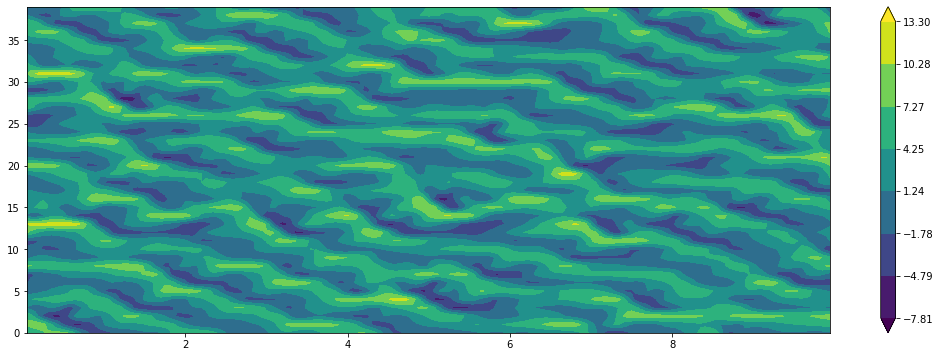

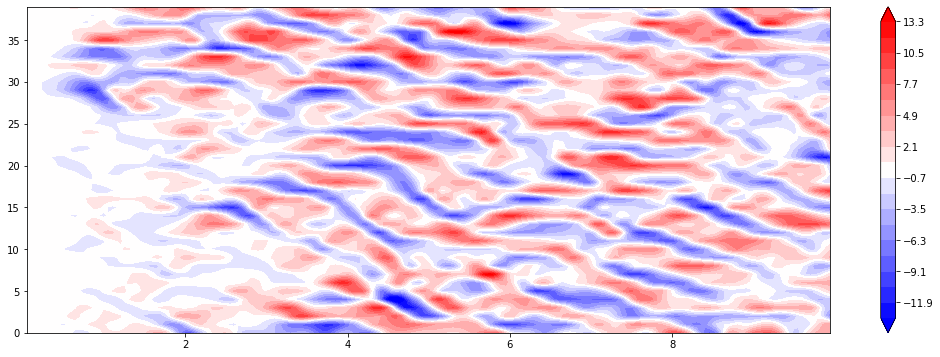

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.2007e+05,  1.1997e+05,  3.7940e-01,  5.9298e-02]], device='cuda:0')
Filter, Elapsed: 26.10833716392517s
Epoch 21: nll = 120044.5625
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982

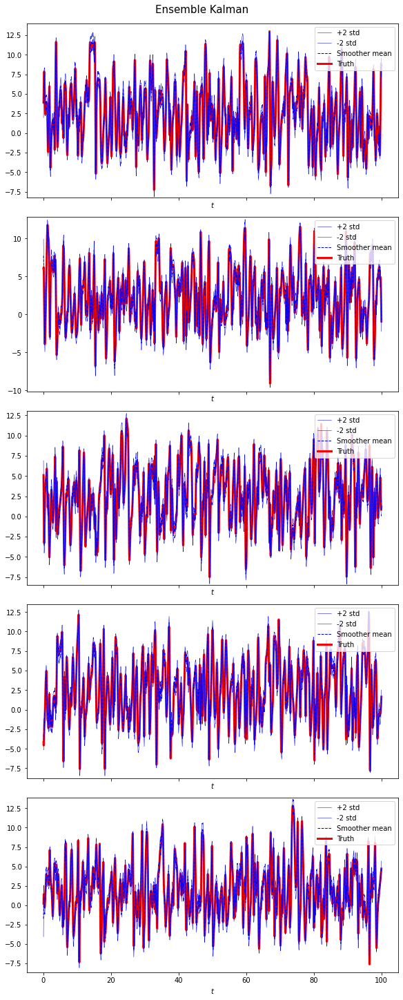

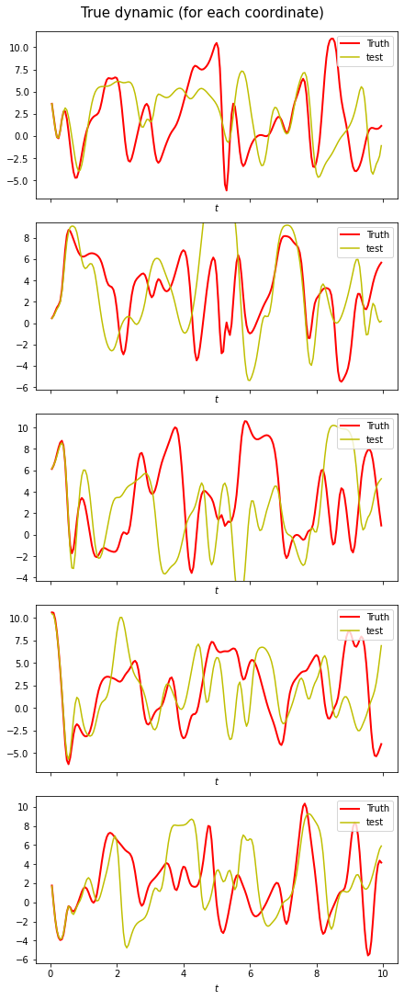

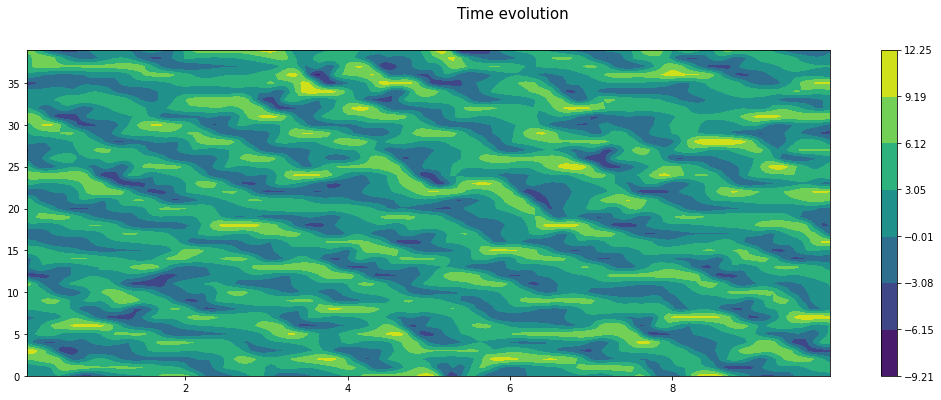

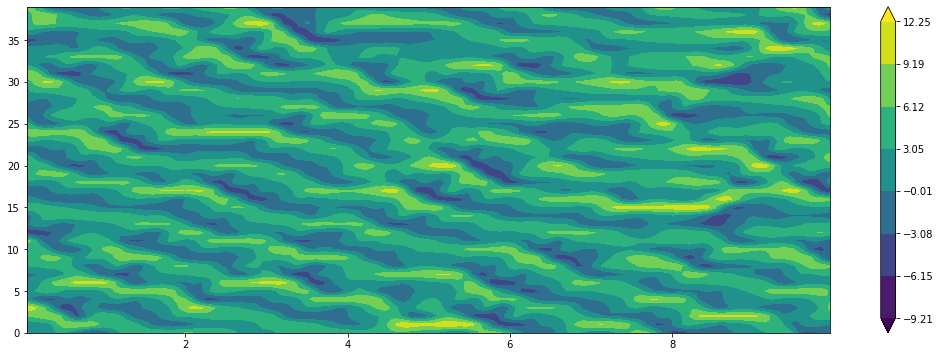

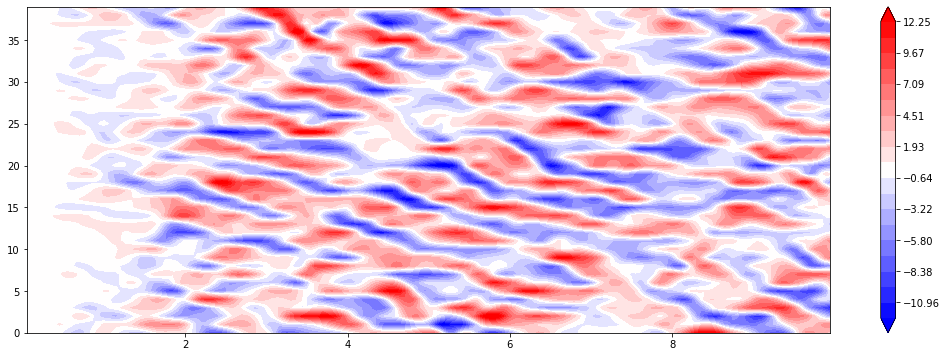

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1995e+05,  1.1991e+05,  3.7759e-01,  5.6373e-02]], device='cuda:0')
Filter, Elapsed: 26.332653999328613s
Epoch 26: nll = 119927.546875
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2

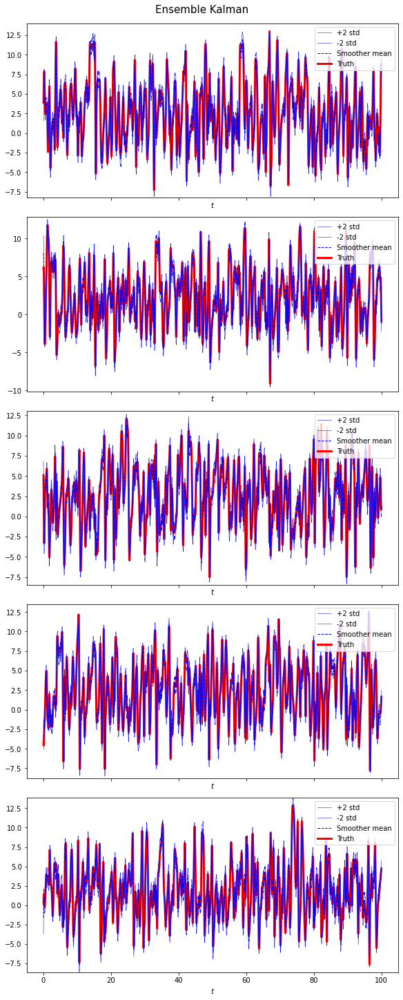

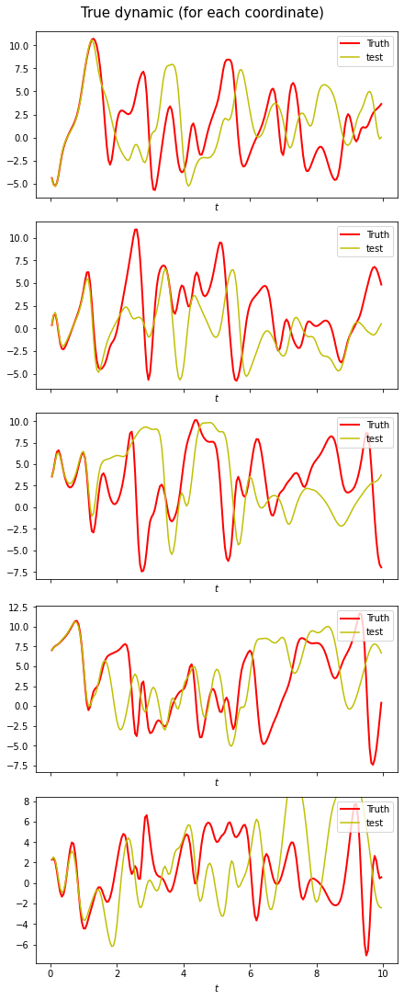

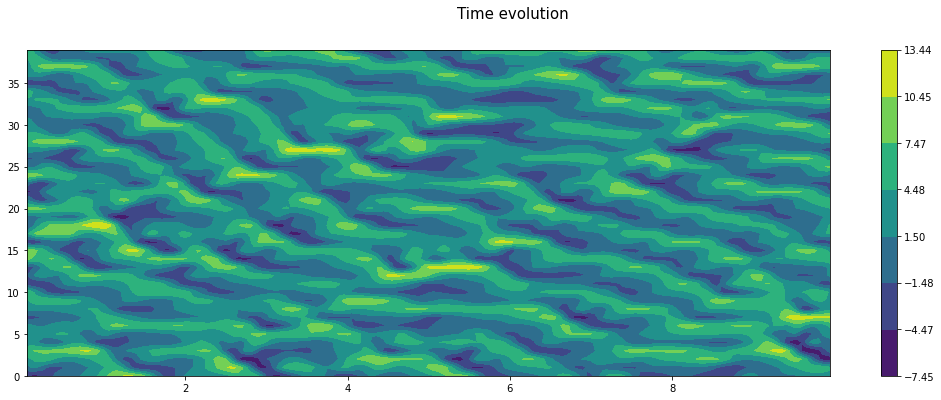

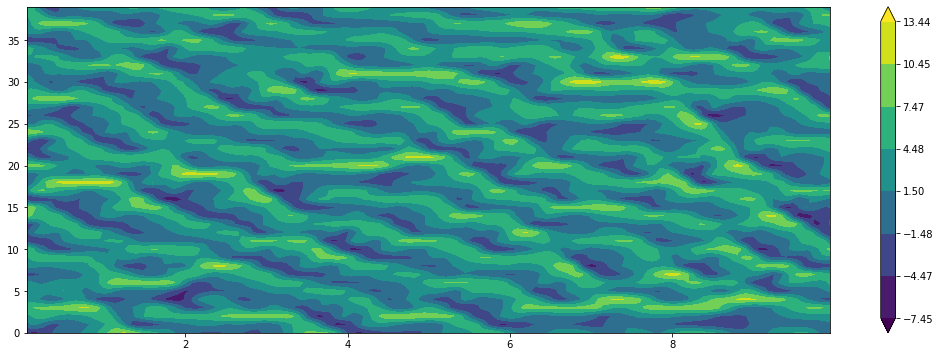

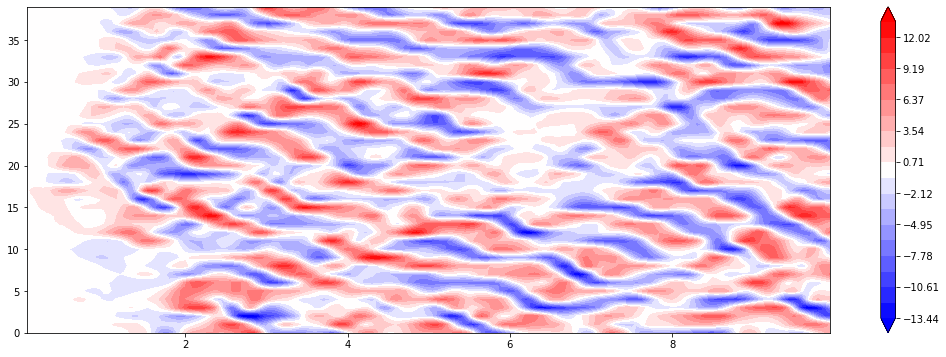

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1990e+05,  1.1980e+05,  3.7505e-01,  5.3033e-02]], device='cuda:0')
Filter, Elapsed: 26.20936918258667s
Epoch 31: nll = 119849.875
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e

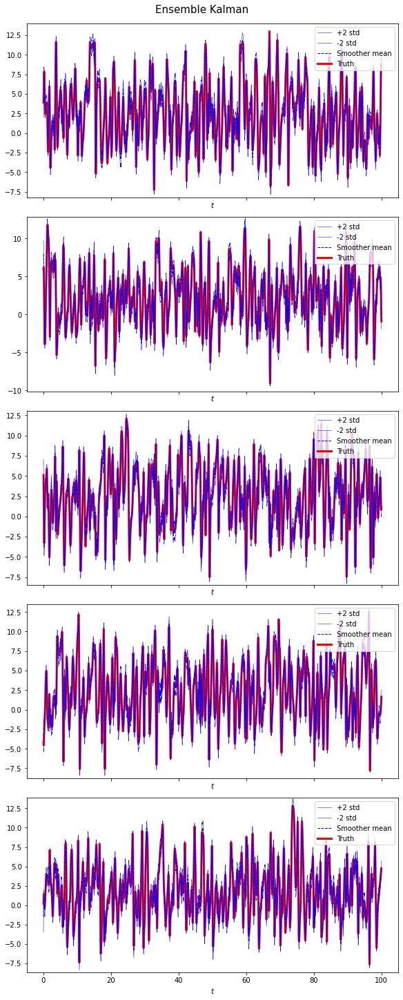

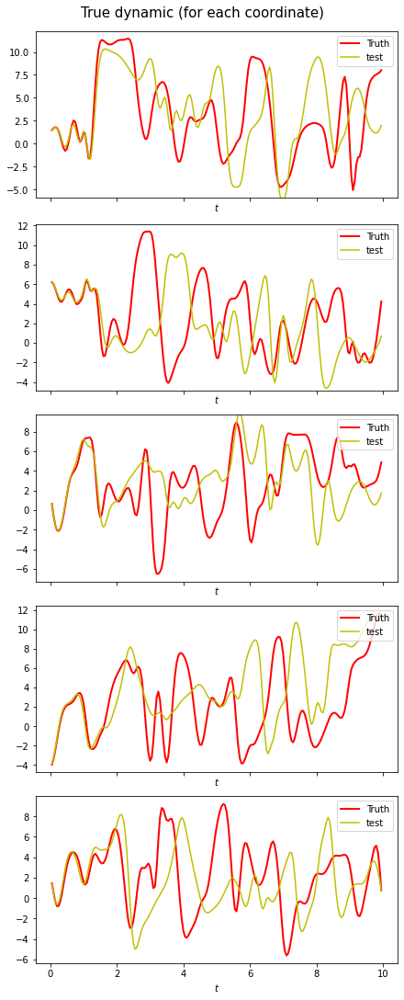

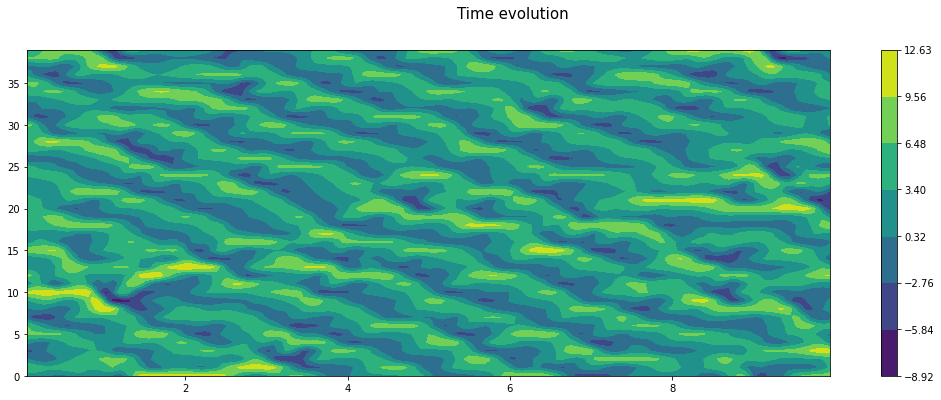

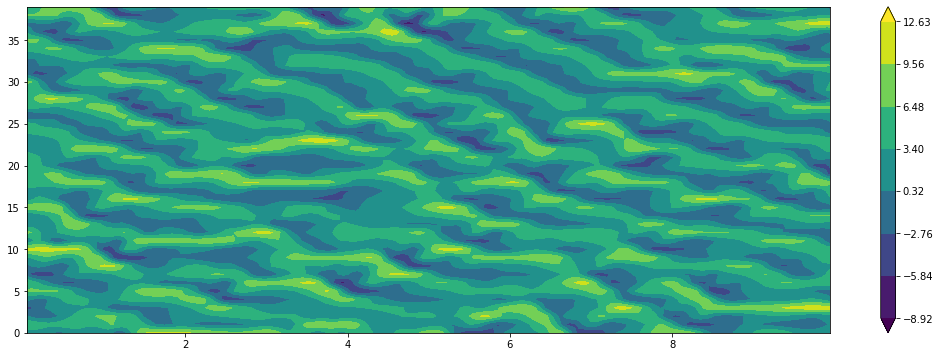

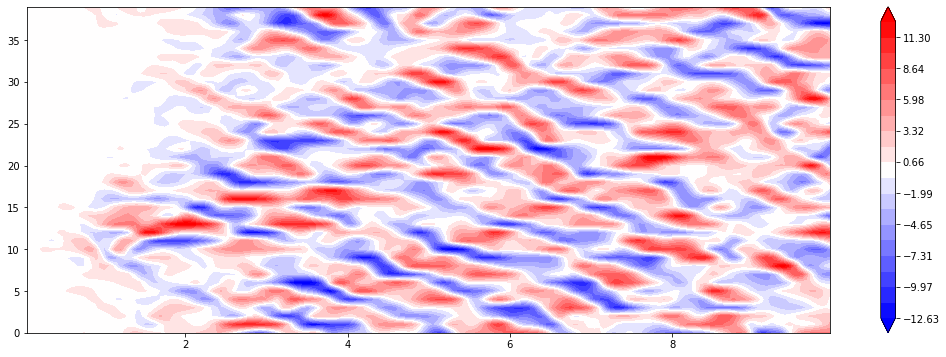

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1989e+05,  1.1982e+05,  3.7576e-01,  5.1579e-02]], device='cuda:0')
Filter, Elapsed: 26.52028226852417s
Epoch 36: nll = 119866.15625
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.298

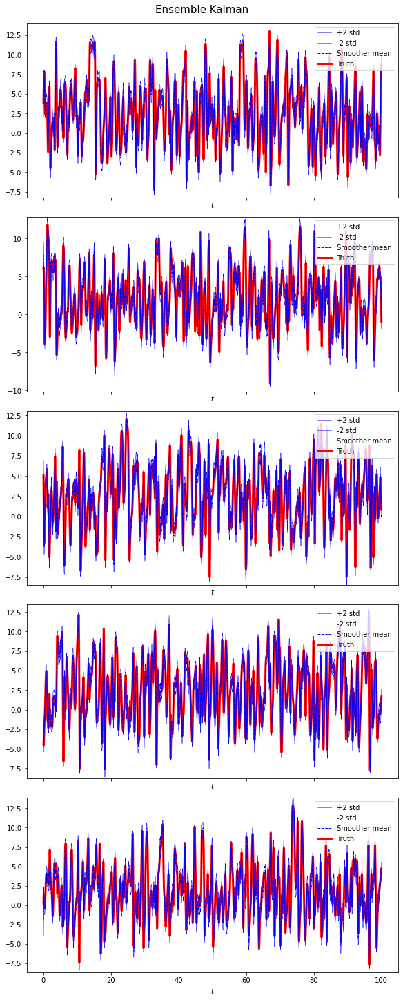

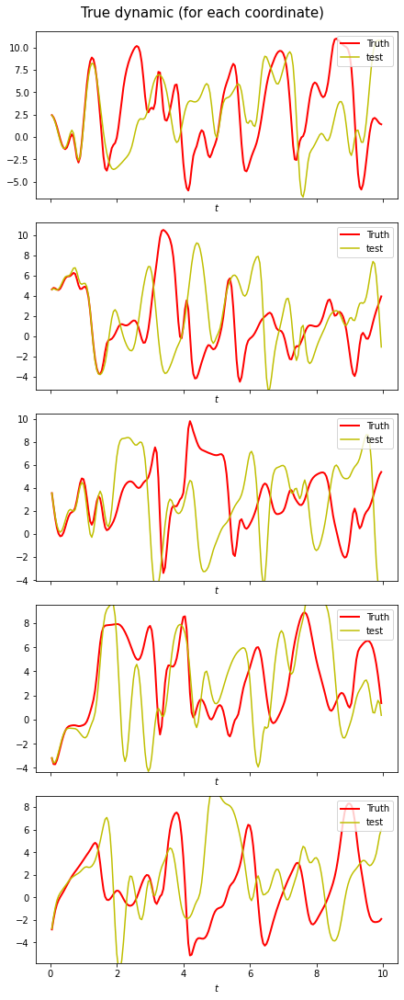

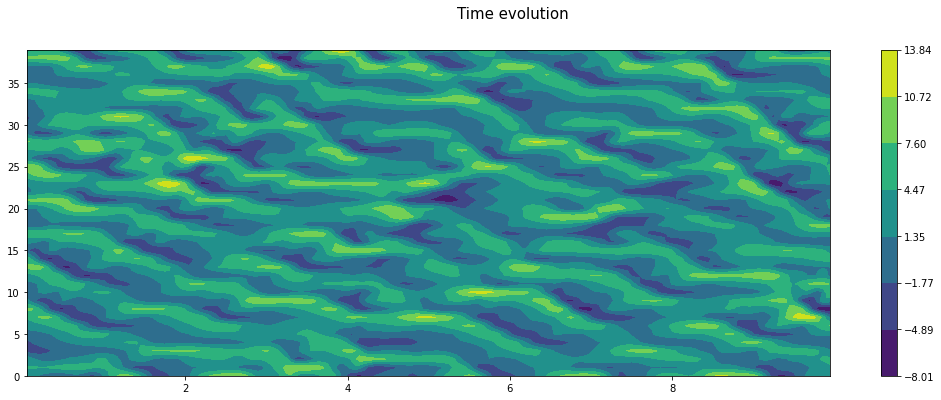

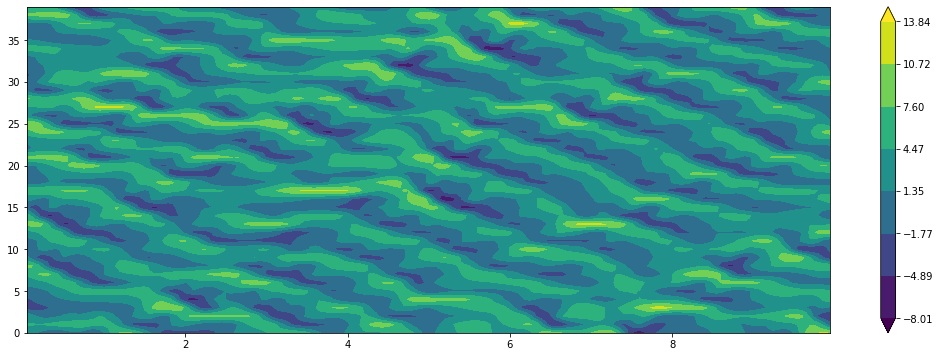

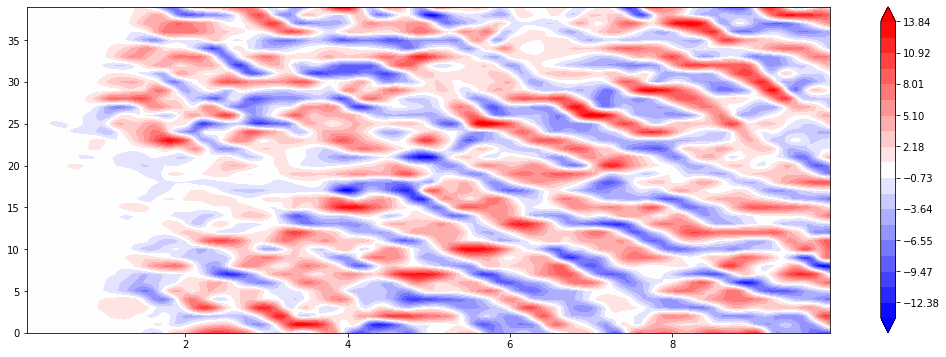

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1980e+05,  1.1978e+05,  3.7463e-01,  4.9759e-02]], device='cuda:0')
Filter, Elapsed: 26.338135719299316s
Epoch 41: nll = 119818.515625
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2

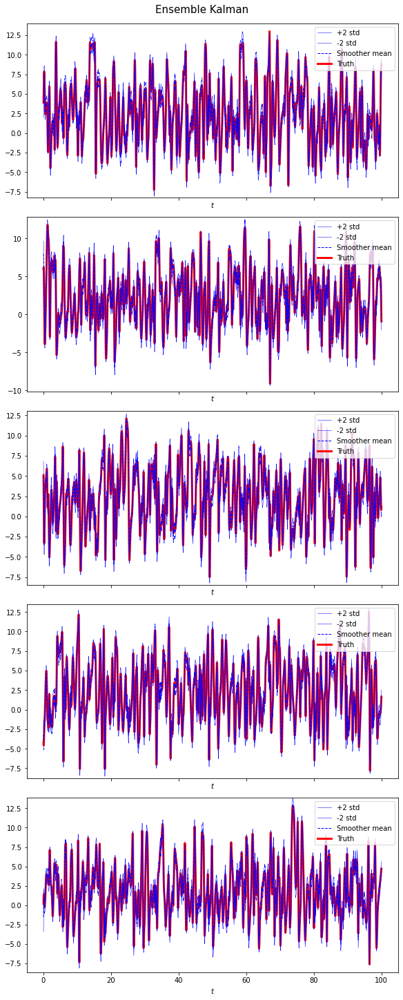

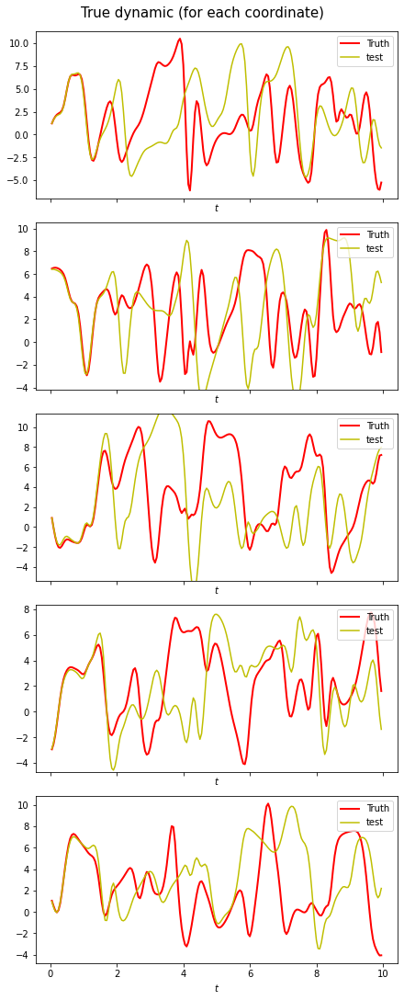

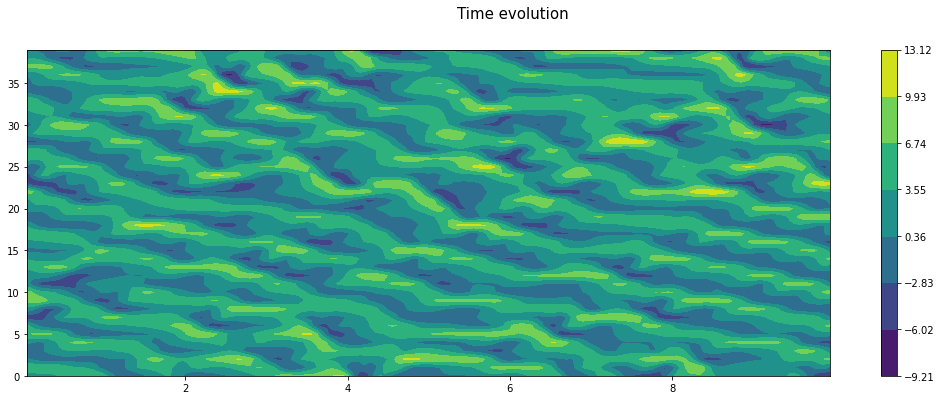

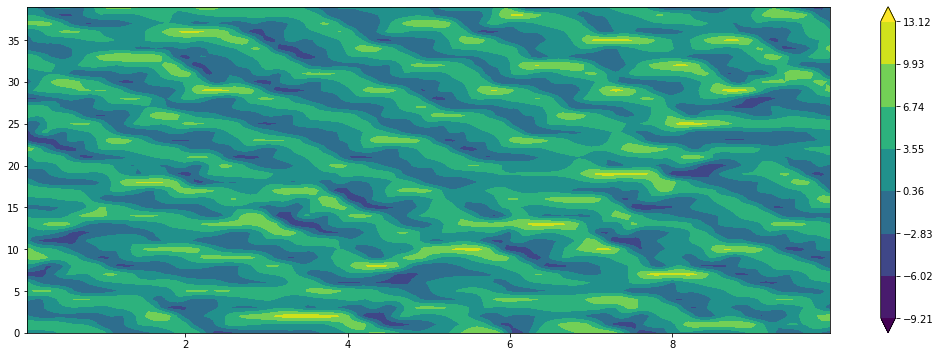

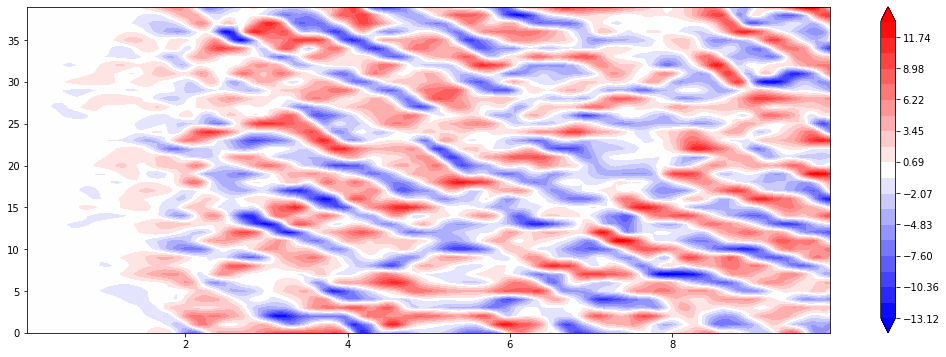

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1976e+05,  1.1977e+05,  3.7403e-01,  4.8325e-02]], device='cuda:0')
Filter, Elapsed: 26.414748191833496s
Epoch 46: nll = 119796.53125
tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.29

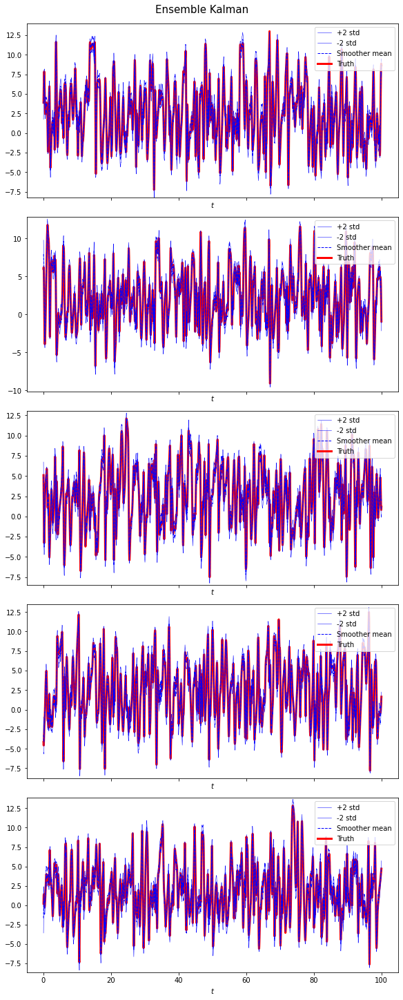

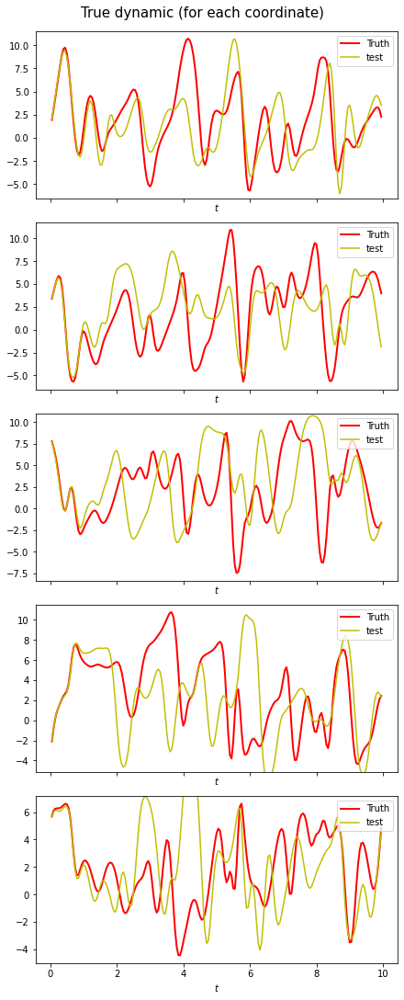

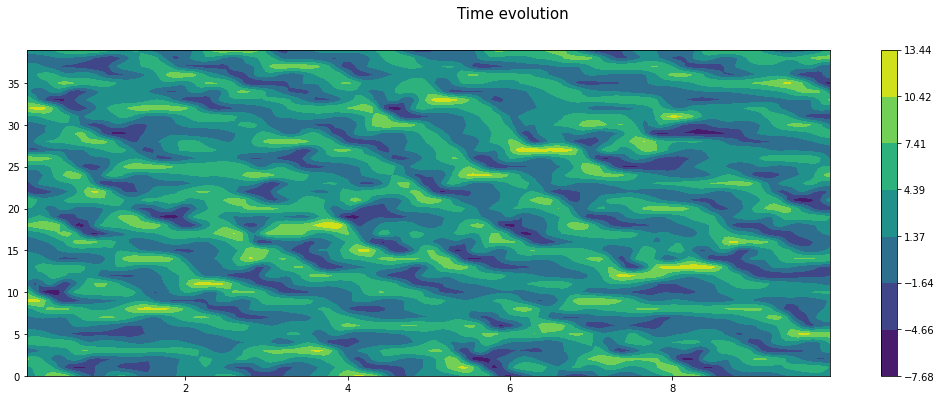

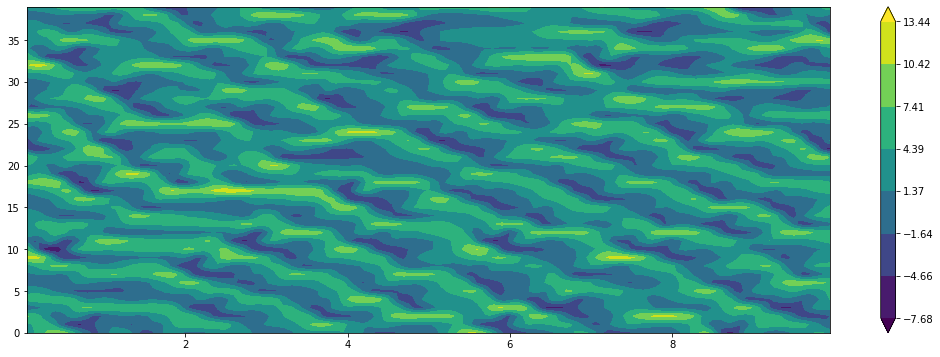

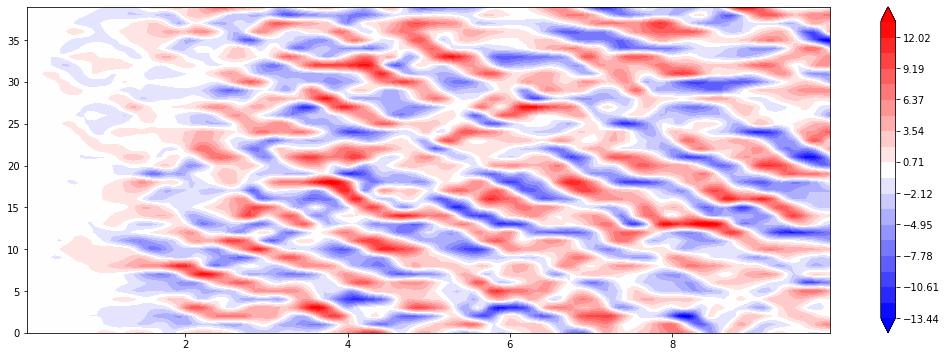

tensor([[-1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
         -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00, -1.2982e+00,
          1.1975e+05,  1.1974e+05,  3.7365e-01,  4.7262e-02]], device='cuda:0')
time: 47min 31s (started: 2021-05-04 18:15:28 +00:00)


In [ ]:
importlib.reload(utils)
importlib.reload(DAModel)
importlib.reload(DEModel)
importlib.reload(NNModel)
importlib.reload(sys.modules['core_training'])
from core_training import train_loop_diff, train_loop_em, train_loop_particle

def monitor(ode_func, model_Q_param, neg_log_likelihood, test_neg_log_likelihood, test_mse, fs, nll_suro_em, algorithm, device):
  res = torch.zeros(0, device=device)
  res = torch.cat((res, model_Q_param.detach().clone().view(-1)))
  res = torch.cat((res, neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_mse.mean().detach().clone().view(-1)))
  res = torch.cat((res, fs.mean().detach().clone().view(-1)))
  # if algorithm == "em":
  #   res = torch.cat((res, nll_suro_em.mean().detach().clone().view(-1)))
  # res = torch.cat((res, ode_func.coeff.grad.detach().clone().view(-1)))

  # for param in ode_func.parameters():
  #   print(param)
  # print(model_Q_param.grad)
  return res.unsqueeze(dim=0)

# enkf_kwargs['save_intermediate_step']=False

coeff_list = torch.zeros(18).unsqueeze(0).repeat(4,1)
Q_list = utils.softplus_inv(2*torch.ones(x_dim, device=device)).unsqueeze(0).repeat(4,1)
coeff_list_clone = coeff_list.detach().clone()
Q_list_clone = Q_list.detach().clone()
coeff_list_clone2 = coeff_list.detach().clone()
Q_list_clone2 = Q_list.detach().clone()
N_ensem = 50

# enkf_kwargs['likelihood_warmup']=30
# enkf_kwargs['adjoint']=True
# monitor_res_all_diff = torch.zeros(0, device=device)
# for iter in range(1):#iter in range(1): 
#   # learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_ode_func = NNModel.L96_ODE_Net_2(x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-2},
#                              {'params':learned_model_Q, 'lr':1e-1}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.5)
#   monitor_res = train_loop_diff(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=100, 
#                                 scheduler=None, batch_length=30, bs=4, print_every_n_epochs=5, test_every_n_epochs=1, tbptt=30, lr_decay=0.5,true_system="L96", method='enkf', train_size=1, clip_norm=None, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_diff = torch.cat((monitor_res_all_diff, monitor_res.unsqueeze(0)))

enkf_kwargs['smooth_lag']=0.0
enkf_kwargs['likelihood_warmup']=50
monitor_res_all_em = torch.zeros(0, device=device)
for iter in range(1):
  # learned_ode_func = NNModel.Lorenz96_dict_param(test_coeff, device, x_dim).to(device)
  # a = torch.load(f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/L96_conv_28")
  learned_ode_func = NNModel.L96_ODE_Net(x_dim).to(device)
  # learned_ode_func.load_state_dict(a['ode_state_diff'])
  learned_model_Q = nn.Parameter(-0.7*Q_list_clone[iter]).to(device)
  # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
  # optimizer = torch.optim.Adagrad([{'params':learned_ode_func.parameters(), 'lr':1e-1},
  #                            {'params':learned_model_Q, 'lr':1e-1}])
  optimizer = torch.optim.Adagrad([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
  # optimizer = torch.optim.Adam([{'params':learned_model_Q, 'lr':1e-2}])
  # scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=25, gamma=0.5)
  scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer,  gamma=0.98)
  monitor_res = train_loop_em(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=51, 
                              scheduler=scheduler, batch_length=4, bs=50, print_every_n_epochs=5, test_every_n_epochs=1, tbptt=1, track_Q=False, lr_decay=None,true_system="L96", true_ode_func=true_ode_func, u0_test=u0_test, draw_stats=False, train_size=1, m_step_type="mean", m_steps=5, monitor=monitor, **enkf_kwargs)
  monitor_res_all_em = torch.cat((monitor_res_all_em, monitor_res.unsqueeze(0)))

# enkf_kwargs['likelihood_warmup']=30
# monitor_res_all_particle = torch.zeros(0, device=device)
# for iter in range(1):#iter in range(1): 
#   learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list_clone2[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
#                              {'params':learned_model_Q, 'lr':1e-1}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=400, gamma=0.5)
#   monitor_res = train_loop_particle(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=50, 
#                                 scheduler=None, batch_length=30, bs=8, print_every_n_epochs=20, test_every_n_epochs=5, tbptt=6,true_system="L96", train_size=1, clip_norm=None, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_particle = torch.cat((monitor_res_all_particle, monitor_res.unsqueeze(0)))


In [ ]:
torch.save({'ode_state_em': learned_ode_func.state_dict(), 'Q_em': learned_model_Q,
          'monitor_res_all_em': monitor_res_all_em},
           f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/0503/L96_Q0_R1_OB005F_IT005_K2000_em_direct2")

time: 12.3 ms (started: 2021-05-04 03:15:25 +00:00)


In [1]:
importlib.reload(utils)
importlib.reload(DAModel)
importlib.reload(NNModel)
importlib.reload(sys.modules['core_training'])
from core_training import train_loop_diff, train_loop_em, train_loop_particle, train_loop_direct

def monitor(ode_func, model_Q_param, neg_log_likelihood, test_neg_log_likelihood, test_mse, fs, nll_suro_em, algorithm, device):
  res = torch.zeros(0, device=device)
  # res = torch.cat((res, ode_func.coeff.detach().clone().view(-1)))
  res = torch.cat((res, model_Q_param.detach().clone().view(-1)))
  res = torch.cat((res, neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_neg_log_likelihood.mean().detach().clone().view(-1)))
  res = torch.cat((res, test_mse.mean().detach().clone().view(-1)))
  res = torch.cat((res, fs.mean().detach().clone().view(-1)))
  # if algorithm == "em":
  #   res = torch.cat((res, nll_suro_em.mean().detach().clone().view(-1)))
  # res = torch.cat((res, ode_func.coeff.grad.detach().clone().view(-1)))

  # for param in ode_func.parameters():
  #   print(param.grad)
  return res.unsqueeze(dim=0)


coeff_list = torch.zeros(18).unsqueeze(0).repeat(4,1)
Q_list = utils.softplus_inv(2*torch.ones(x_dim, device=device)).unsqueeze(0).repeat(4,1)
coeff_list_clone = coeff_list.detach().clone()
Q_list_clone = Q_list.detach().clone()
coeff_list_clone2 = coeff_list.detach().clone()
Q_list_clone2 = Q_list.detach().clone()
N_ensem = 50


enkf_kwargs['likelihood_warmup']=20
# enkf_kwargs['var_inflation']=1.03
monitor_res_all_direct = torch.zeros(0, device=device)
for iter in range(1):#iter in range(1): 
  # learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
  learned_ode_func = NNModel.L96_ODE_Net_2(x_dim).to(device)
  learned_model_Q = nn.Parameter(-0.5*Q_list[iter]).to(device)
  # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
  # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-2},
  #                            {'params':learned_model_Q, 'lr':1e-1}])
  optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-2}])
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=25, gamma=0.5)
  # scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer,  gamma=0.9)
  monitor_res = train_loop_direct(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=101, 
                                scheduler=scheduler, bs=200, print_every_n_epochs=5, test_every_n_epochs=1, true_system="L96", true_ode_func=true_ode_func, u0_test=u0_test, draw_stats=False, train_size=1, monitor=monitor, **enkf_kwargs)
  monitor_res_all_direct = torch.cat((monitor_res_all_direct, monitor_res.unsqueeze(0)))

# enkf_kwargs['smooth_lag']=0
# enkf_kwargs['likelihood_warmup']=40
# monitor_res_all_em = torch.zeros(0, device=device)
# for iter in range(1):
#   learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list_clone[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
#                              {'params':learned_model_Q, 'lr':1e-1}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=25, gamma=0.5)
#   monitor_res = train_loop_em(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=75, 
#                               scheduler=scheduler, batch_length=1200, bs=100, print_every_n_epochs=5, test_every_n_epochs=5, tbptt=1,true_system="L96", train_size=1, m_step_type="mean", m_steps=5, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_em = torch.cat((monitor_res_all_em, monitor_res.unsqueeze(0)))

# enkf_kwargs['likelihood_warmup']=30
# monitor_res_all_particle = torch.zeros(0, device=device)
# for iter in range(1):#iter in range(1): 
#   learned_ode_func = NNModel.Lorenz96_dict_param(coeff_list[iter], device, x_dim).to(device)
#   learned_model_Q = nn.Parameter(Q_list_clone2[iter]).to(device)
#   # learned_model_Q = utils.softplus_inv(0.1*torch.ones(x_dim, device=device))
#   optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1},
#                              {'params':learned_model_Q, 'lr':1e-1}])
#   # optimizer = torch.optim.Adam([{'params':learned_ode_func.parameters(), 'lr':1e-1}])
#   scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=400, gamma=0.5)
#   monitor_res = train_loop_particle(learned_ode_func, true_obs_func, t_obs, y_obs, out, out_intermediate, N_ensem, init_m, init_C_param, learned_model_Q, noise_R_true, device, optimizer, n_epochs=50, 
#                                 scheduler=None, batch_length=30, bs=8, print_every_n_epochs=20, test_every_n_epochs=5, tbptt=6,true_system="L96", train_size=1, clip_norm=None, monitor=monitor, **enkf_kwargs)
#   monitor_res_all_particle = torch.cat((monitor_res_all_particle, monitor_res.unsqueeze(0)))


NameError: ignored

In [ ]:
torch.save({'ode_state_direct': learned_ode_func.state_dict(), 'Q_direct': learned_model_Q,
          'monitor_res_all_direct': monitor_res_all_direct},
           f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/L96_Q0_R0_OB005F_IT005_K2000_direct_0429")

time: 11.5 ms (started: 2021-04-29 09:30:42 +00:00)


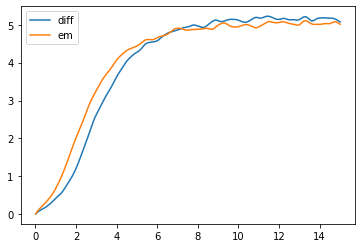

time: 11.3 s (started: 2021-04-25 20:43:38 +00:00)


In [ ]:
import metrics
importlib.reload(metrics)
a = torch.load(f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/L96_conv_28")
diff_ode_func = NNModel.L96_ODE_Net_2(x_dim).to(device)
diff_ode_func.load_state_dict(a['ode_state_diff'])
em_ode_func = learned_ode_func
with torch.no_grad():
  t_test = torch.arange(0, 9, 0.05)[1:].to(device)
  diff_fs=metrics.forecast_skill(true_ode_func, diff_ode_func, t_test, u0_test, device, 'rk4', False)
  em_fs=metrics.forecast_skill(true_ode_func, em_ode_func, t_test, u0_test, device, 'rk4', False)
plt.plot(t_test.cpu().numpy()*1.67, diff_fs.cpu().numpy(), label='diff')
plt.plot(t_test.cpu().numpy()*1.67, em_fs.cpu().numpy(), label='em')
plt.legend()

In [ ]:
importlib.reload(utils)

test_coeff = torch.tensor([8., 0., 0., -1, 0., 0., 0., 0., 0., 0., 0., -1., 0., 0., 0., 0., 1., 0.], device=device)

monitor_res_all_diff_scaled = monitor_res_all_diff.detach().clone()
monitor_res_all_diff_scaled[:, :, 19:59] = utils.softplus(monitor_res_all_diff_scaled[:, :, 19:59])
monitor_res_all_em_scaled = monitor_res_all_em.detach().clone()
monitor_res_all_em_scaled[:, :, 19:59] = utils.softplus(monitor_res_all_em_scaled[:, :, 19:59])
# monitor_res_all_particle_scaled = monitor_res_all_particle.detach().clone()
# monitor_res_all_particle_scaled[:, :, 3:6] = utils.softplus(monitor_res_all_particle_scaled[:, :, 3:6])

monitor_res=[monitor_res_all_diff_scaled,monitor_res_all_em_scaled]#,monitor_res_all_particle_scaled]
methods=["Diff-EnKF","EM-EnKS"]#,"V-SMC"]
titles=["mse(true_coeff, learned_coeff)", "Learned_coeff", "Learned Q", "train_neg_log_likelihood","test_neg_log_likelihood"]
truths = [None, *test_coeff.tolist(), *[0.1 for _ in range(40)], None, None]
logscale={0}#{0,1,2}
groups=[(1,19),(19,29)]
plots_to_show = [2]
utils.plot_monitor_res_new(monitor_res, methods, titles, truths, logscale, groups, True, plots_to_show, n_cols=1, subplot_width=16, subplot_height=12)

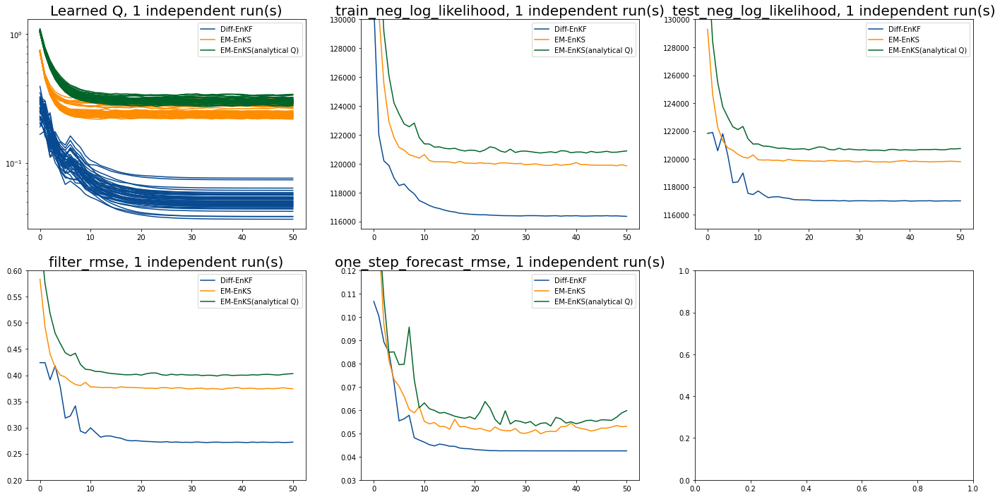

time: 1.51 s (started: 2021-05-04 05:46:59 +00:00)


In [ ]:
importlib.reload(utils)
def custom_axes(axes):
  axes[0,1].set_ylim(115500, 130000)
  axes[0,2].set_ylim(115000, 130000)
  axes[1,0].set_ylim(0.2,0.6)
  axes[1,1].set_ylim(0.03,0.12)
  return

a_diff = torch.load(f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/0503/L96_Q0_R1_OB005F_IT005_K2000_diff")#,map_location=torch.device('cpu'))
monitor_res_all_diff = a_diff['monitor_res_all_diff']
a_em = torch.load(f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/0503/L96_Q0_R1_OB005F_IT005_K2000_em_optim")#,map_location=torch.device('cpu'))
monitor_res_all_em = a_em['monitor_res_all_em']
a_em2 = torch.load(f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/0503/L96_Q0_R1_OB005F_IT005_K2000_em_direct")#,map_location=torch.device('cpu'))
monitor_res_all_em2 = a_em2['monitor_res_all_em']

monitor_res_all_diff_scaled = monitor_res_all_diff.detach().clone()
monitor_res_all_diff_scaled[:, :, :40] = utils.softplus(monitor_res_all_diff_scaled[:, :, :40])
monitor_res_all_em_scaled = monitor_res_all_em.detach().clone()
monitor_res_all_em_scaled[:, :, :40] = utils.softplus(monitor_res_all_em_scaled[:, :, :40])
monitor_res_all_em2_scaled = monitor_res_all_em2.detach().clone()
monitor_res_all_em2_scaled[:, :, :40] = utils.softplus(monitor_res_all_em2_scaled[:, :, :40])

monitor_res=[monitor_res_all_diff_scaled,monitor_res_all_em_scaled,monitor_res_all_em2_scaled]
methods=["Diff-EnKF","EM-EnKS", "EM-EnKS(analytical Q)"]
titles=["Learned Q", "train_neg_log_likelihood","test_neg_log_likelihood","filter_rmse","one_step_forecast_rmse"]
truths = [None, None,None,None,None]#[*[0.1 for _ in range(40)], None, None, None, None]
logscale={0}#{0,1,2}
groups=[(0,40)]
plots_to_show = [0,1,2,3,4]
utils.plot_monitor_res_new(monitor_res, methods, titles, truths, logscale, groups, True, plots_to_show, n_cols=3, subplot_width=8, subplot_height=6, custom_axes=custom_axes)

In [ ]:
import metrics
importlib.reload(metrics)
a_diff = torch.load(f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/L96_Q0_R1_OB005RDN20_IT005_K2000_diff_0427")#,map_location=torch.device('cpu'))
saved_ode_func_diff = NNModel.L96_ODE_Net_2(x_dim).to(device)
saved_ode_func_diff.load_state_dict(a_diff['ode_state_diff'])
# a_em = torch.load(f"/content/drive/MyDrive/project_Yuming/codes/checkpoints/L96_Q0_R1_OB005RDN20_IT005_K2000_em_0427")#,map_location=torch.device('cpu'))
# saved_ode_func_em = NNModel.L96_ODE_Net_2(x_dim).to(device)
# saved_ode_func_em.load_state_dict(a_em['ode_state_em'])
with torch.no_grad():
  t_test = torch.arange(0, 9, 0.05)[1:].to(device)
  fs_diff=metrics.forecast_skill(true_ode_func, saved_ode_func_diff, t_test, u0_test, device, 'rk4', False)
  # fs_em=metrics.forecast_skill(true_ode_func, saved_ode_func_em, t_test, u0_test, device, 'rk4', False)
  fs_tmp=metrics.forecast_skill(true_ode_func, learned_ode_func, t_test, u0_test, device, 'rk4', False)

spec_diff = metrics.lyapunov_exponent(saved_ode_func_diff, 0.05, 0.05, 2500, u0_test[8], device, 'rk4')
# spec_em = metrics.lyapunov_exponent(saved_ode_func_em, 0.05, 0.05, 5000, u0_test[8], device, 'rk4')
spec_tmp = metrics.lyapunov_exponent(learned_ode_func, 0.05, 0.05, 2500, u0_test[8], device, 'rk4')
spec_true = metrics.lyapunov_exponent(true_ode_func, 0.05, 0.05, 2500, u0_test[8], device, 'rk4')

t_test2 = torch.arange(0, 120, 0.05)[1:].to(device)
with torch.no_grad():
  f, Pxx_den_diff=metrics.power_spectrum_density(saved_ode_func_diff, t_test2, u0_test[3], device,'rk4',512)#, model_Q=0.01*torch.eye(x_dim, device=device))
  # f, Pxx_den_em=metrics.power_spectrum_density(saved_ode_func_em, t_test2, u0_test[3], device,'rk4',512)#, model_Q=0.01*torch.eye(x_dim, device=device))
  f, Pxx_den_tmp=metrics.power_spectrum_density(learned_ode_func, t_test2, u0_test[3], device,'rk4',512)#, model_Q=0.01*torch.eye(x_dim, device=device))
  f, Pxx_den_true=metrics.power_spectrum_density(true_ode_func, t_test2, u0_test[3], device,'rk4',512)

time: 6min 48s (started: 2021-04-29 09:31:48 +00:00)


[ 1.7305415e+00  1.4537883e+00  1.4257637e+00  1.1528101e+00
  9.6280932e-01  8.6877120e-01  7.4029088e-01  6.6324264e-01
  4.8183116e-01  3.2792300e-01  3.1753060e-01  1.4106855e-01
  6.6734605e-02 -3.4367216e-03 -1.6007903e-01 -2.3903662e-01
 -3.5979235e-01 -4.2024115e-01 -5.8755577e-01 -6.6656649e-01
 -8.3966213e-01 -9.2266494e-01 -1.0202928e+00 -1.1270975e+00
 -1.2628434e+00 -1.3906792e+00 -1.4842834e+00 -1.6147683e+00
 -1.7523746e+00 -1.9836016e+00 -2.1083694e+00 -2.3224328e+00
 -2.6821189e+00 -2.8184991e+00 -3.2929316e+00 -3.7460306e+00
 -4.0347104e+00 -4.4483714e+00 -4.7349830e+00 -4.9283395e+00]
[ 1.7071862e+00  1.4937459e+00  1.3080555e+00  1.1657116e+00
  9.3416554e-01  8.6444956e-01  7.3431402e-01  6.5800750e-01
  4.8332670e-01  3.2600644e-01  2.6297793e-01  1.2553471e-01
  6.3623622e-02 -2.9137344e-03 -1.5113965e-01 -2.2483516e-01
 -2.9590192e-01 -4.6387956e-01 -5.8155590e-01 -7.0910376e-01
 -7.7557606e-01 -8.7961221e-01 -9.7492534e-01 -1.1279854e+00
 -1.2458053e+00 -1.3474

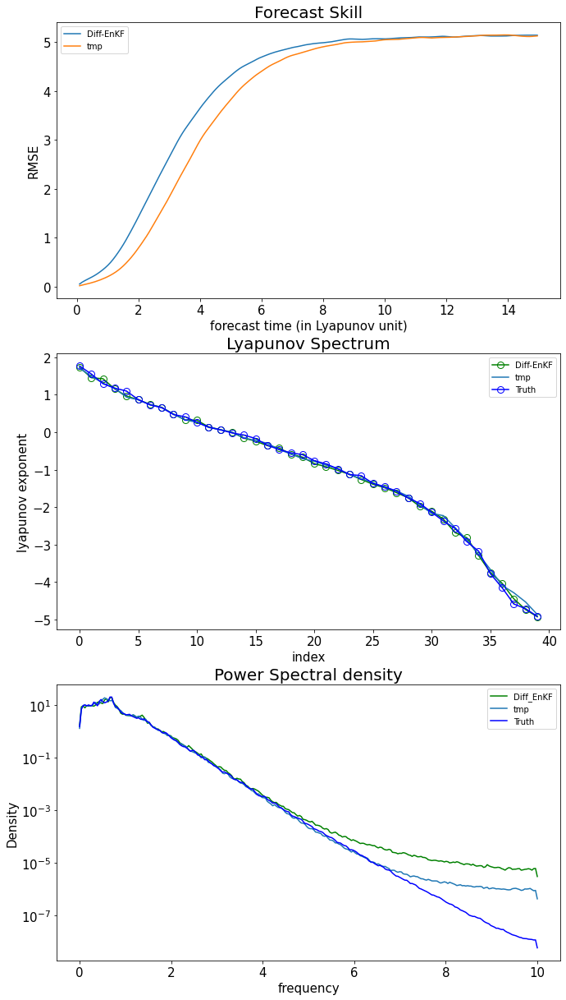

time: 616 ms (started: 2021-04-29 09:38:39 +00:00)


In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(11, 21), constrained_layout=False)
axes[0].plot(t_test.cpu().numpy()*1.67, fs_diff.cpu().numpy(), label='Diff-EnKF')
# axes[0].plot(t_test.cpu().numpy()*1.67, fs_em.cpu().numpy(), label='EM-EnKS')
axes[0].plot(t_test.cpu().numpy()*1.67, fs_tmp.cpu().numpy(), label='tmp')
axes[0].set_title('Forecast Skill', fontsize=20)
axes[0].set_xlabel('forecast time (in Lyapunov unit)', fontsize=15)
axes[0].set_ylabel('RMSE', fontsize=15)
axes[0].xaxis.set_tick_params(labelsize=15)
axes[0].yaxis.set_tick_params(labelsize=15)
axes[0].legend()

axes[1].plot(spec_diff,'go-',mfc='none',ms=8, label='Diff-EnKF')
# axes[1].plot(spec_em,'o-', color='orange',mfc='none',ms=8, label='EM-EnKS')
axes[1].plot(spec_tmp, label='tmp')
axes[1].plot(spec_true,'bo-',mfc='none',ms=8, label='Truth')
axes[1].set_title("Lyapunov Spectrum", fontsize=20)
axes[1].set_xlabel('index', fontsize=15)
axes[1].set_ylabel('lyapunov exponent', fontsize=15)
axes[1].xaxis.set_tick_params(labelsize=15)
axes[1].yaxis.set_tick_params(labelsize=15)
axes[1].legend()
print(spec_diff)
# print(spec_em)
print(spec_tmp)
print(spec_true)

axes[2].semilogy(f, Pxx_den_diff, 'g-',label='Diff_EnKF')
# axes[2].semilogy(f,  Pxx_den_em,color='orange', label='EM-EnKS')
axes[2].semilogy(f, Pxx_den_tmp, label='tmp')
axes[2].semilogy(f,  Pxx_den_true, 'b-',label='Truth')
axes[2].set_title("Power Spectral density", fontsize=20)
axes[2].set_xlabel('frequency', fontsize=15)
axes[2].set_ylabel('Density', fontsize=15)
axes[2].xaxis.set_tick_params(labelsize=15)
axes[2].yaxis.set_tick_params(labelsize=15)
axes[2].legend()

plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 6), constrained_layout=False)
        with torch.no_grad():
          fs = metrics.forecast_skill(true_ode_func, ode_func, t_obs_test, u0_test, device, 'rk4', False)
        axes[0].plot(t_obs_test.cpu().numpy(), fs.cpu().numpy())
        axes[0].set_title('Forecast Skill')
        spec = metrics.lyapunov_exponent(ode_func, step_size, step_size, 1000, u0_test[3], device, 'rk4')
        spec_true = metrics.lyapunov_exponent(true_ode_func, step_size, step_size, 1000, u0_test[3], device, 'rk4')
        axes[1].plot(spec, label='learned')
        axes[1].plot(spec_true, label='Truth')
        axes[1].set_title("Lyapunov spectrum")
        axes[1].legend()
        t_test = torch.arange(0, 120, 0.05)[1:].to(device)
        with torch.no_grad():
          f, Pxx_den=metrics.power_spectrum_density(ode_func, t_test, u0_test[0], device,'rk4',512)#, model_Q=0.01*torch.eye(x_dim, device=device))
          f, Pxx_den_true=metrics.power_spectrum_density(true_ode_func, t_test, u0_test[0], device,'rk4',512)
        axes[2].semilogy(f, Pxx_den, label='learned')
        axes[2].semilogy(f, Pxx_den_true, label='Truth')
        axes[2].set_title("Power Spectrum density")
        axes[2].set_xlabel('frequency')
        axes[2].set_ylabel('Density')
        axes[2].legend()
        plt.show()